## First attempt at combining the alm, wigner rotations and visibility response

In [1]:
import os

import numpy as np
import scipy as sp

# Plotting
#import matplotlib.pyplot as plt
import cmocean
import cmocean.cm as cmo
import pylab as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

# Mapping
import healpy as hp

# Wigner D matrices
import spherical, quaternionic

# Simulation
import pyuvsim

# Hydra
import sys
sys.path.append("/home/phil/hera/Hydra") # change this to your own path
import hydra

# Linear solver 
from scipy.sparse.linalg import cg, LinearOperator

# All things astropy
from astropy import units
from astropy.coordinates import EarthLocation, SkyCoord
from astropy.coordinates.builtin_frames import AltAz, ICRS
from astropy.time import Time

# Pandas, dataframe
import pandas as pd

# Time
from numba import jit
import time

# Parallel computing
from joblib import Parallel, delayed

In [2]:
plt.rcParams['font.size'] = '14'
plt.rcParams['savefig.facecolor']='white'
plt.rcParams['axes.titlepad'] = 16
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
})

# Functions

## Functions from `wigner_rotations.ipynb`

In [3]:
# def get_zenith_coord(nside, location, obstime):
#     """
#     Uses location and obstime to calculate the RA/Dec coordinates and pixel index of zenith above the given location.
    
#     ** Inputs:
    
#     location: given as an astropy `EarthLocation` object
#     obstime: given as an astropy `Time` object
#     nside: Resolution
    
#     ** Outputs:
    
#     ra_zenith: Right ascention of zenith at given location and obstime in radian
#     dec_zenith: Declination of zenith at given location and obstime in radian
#     lst: Local sidereal time corresponding to the given opstime and longitude in radian
#     pix_zenith: The index of the pixel at zenith given the resolution (nside)
    
#     """
    
#     # Define AltAz frame at time 0
#     frame_altaz0 = AltAz(obstime=obstime, location=location)
    
#     # # Define a coordinate that is at the zenith at time 0
#     zenith_at_loc_altaz = SkyCoord(alt=90.*units.degree, az=0.*units.degree, frame=frame_altaz0)
#     zenith_at_loc_radec = zenith_at_loc_altaz.copy().transform_to('icrs')

#     # Get zenith coordinates
#     ra_zenith = zenith_at_loc_radec.ra
#     dec_zenith = zenith_at_loc_radec.dec
    
#     # get local sidereal time of obstime0 at this longitude, in radians
#     lst = obstime.sidereal_time(kind='mean', longitude=location.lon)
    
#     # Get the zenith pixel number
#     pix_zenith = hp.ang2pix(nside, ra_zenith.deg, dec_zenith.deg, lonlat=True)
    
#     return ra_zenith.rad, dec_zenith.rad, lst.rad, pix_zenith

In [4]:
def get_index_dataframe(lmax):#, ell=0, m=0):
    '''
    Function to get the list of indices (i, ell, m) for ALL the modes in the `spherical` code
    
    ** Returns
    
    mode_indices: pandas dataframe with indices ordered as (i, ell, m) where i is the 'global' index of the alm-modes.
    
    '''
    # Number of modes 
    nmodes_wigner = lmax*(lmax+2)+1                                  # all modes
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1     # only m>=0 modes

    # Create empty Modes object to get indices
    modes = spherical.Modes(np.zeros(shape=nmodes_wigner, dtype=np.complex128), spin_weight=0)

    #Get ell, m and global index i according to the `spherical` ordering
    indices = np.empty(shape=(nmodes_wigner,2))
    for ell_mode in range(0,lmax+1):
        for m_mode in range(-ell_mode,ell_mode+1):
            i = modes.index(ell=ell_mode,m=m_mode)
            indices[i] = [ell_mode, m_mode]

    indices_df =  pd.DataFrame(indices)
    indices_df.columns = ['ell', 'm']
    
    # List of wigner indices
    mode_indices = indices_df
   
    return mode_indices

In [5]:
def ordering(lmax, ell=0, m=0):
    '''
    Function to ensure the correct ordering of alm-modes when switching between `HEALpy` and `spherical`.
    Finds the indices to convert between the ordering of 'HEALpy' and 'spherical' using ALL modes
    
    ** Returns
    
    wigner2healpy: indices in a list to go from `spherical` ordering to `HEALpy`
    healpy2wigner: indices in a list to go from `HEALpy` ordering to `spherical`
    neg_modes_index: Index of where to cut off negative modes to get to `HEALpy`s alm-convention. Necessary for plotting.
    index_ell_mode: Gets `spherical` indices of the modes matching the input `ell` value Default ell=0 mode.
    index_m_mode: Gets `spherical` indices of the modes matching the input `m` value. Default m=0 mode.
    
    '''
    # Number of modes 
    nmodes_wigner = lmax*(lmax+2)+1                                  # all modes
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1     # only m>=0 modes

    
    # List of wigner indices
    mode_indices = get_index_dataframe(lmax)#, ell, m)

    # Sort indices: spherical (wigner) -->  HEALpy
    df1 = mode_indices.sort_values(['m', 'ell'])
    wigner2healpy = df1.index.to_list()
    
    # Sort indices: HEALpy --> spherical (wigner)
    reset = df1.reset_index()  # resets to HEALpy as standard
    df2 = reset.sort_values(['ell', 'm'])
    healpy2wigner = df2.index.to_list()

    # Get ell, m indicies (ONLY FOR WIGNER)
    df1 = mode_indices.sort_values(['m', 'ell'])
    index_ell_mode = df1.loc[df1.ell == ell].index.tolist()
    index_m_mode = df1.loc[df1.m == m].index.tolist()
    
    # Get cutoff index for removing negative modes
    neg_modes_index = nmodes_wigner-nmodes_healpy
    
    return wigner2healpy, healpy2wigner, neg_modes_index, index_ell_mode, index_m_mode

In [6]:
def WignerDsize(ell_min, mp_max, ell_max=-1): # function taken from the `spherical` utilities, should probably replace with link?
    if ell_max < 0:
        ell_max = mp_max
    if mp_max >= ell_max:
        return (
            ell_max * (ell_max * (4 * ell_max + 12) + 11)
            + ell_min * (1 - 4 * ell_min**2)
            + 3
        ) // 3
    if mp_max > ell_min:
        return (
            3 * ell_max * (ell_max + 2)
            + ell_min * (1 - 4 * ell_min**2)
            + mp_max * (
                3 * ell_max * (2 * ell_max + 4)
                + mp_max * (-2 * mp_max - 3) + 5
            )
            + 3
        ) // 3
    else:
        return (ell_max * (ell_max + 2) - ell_min**2) * (1 + 2 * mp_max) + 2 * mp_max + 1

In [7]:
def WignerDindex(ell, mp, m, ell_min=0, mp_max=-1): # from the spherical utilities, should probably replace with link?
    """
    Compute index into Wigner D matrix
    
    Parameters
    ----------
    ell : int
        Integer satisfying ell_min <= ell <= ell_max
    mp : int
        Integer satisfying -min(ell_max, mp_max) <= mp <= min(ell_max, mp_max)
    m : int
        Integer satisfying -ell <= m <= ell
    ell_min : int, optional
        Integer satisfying 0 <= ell_min <= ell_max.  Defaults to 0.
    mp_max : int, optional
        Integer satisfying 0 <= mp_max.  Defaults to ell.
    
    Returns
    -------
    i : int
        Index into Wigner D matrix arranged as described below
    
    See Also
    --------
    WignerDsize : Total size of the D matrix
    WignerDrange : Array of (ℓ, m', m) indices corresponding to the 𝔇 matrix
    
    Notes
    -----
    This assumes that the Wigner D matrix is arranged as
        [
            𝔇(ℓ, mp, m)
            for ℓ in range(ell_min, ell_max+1)
            for mp in range(-min(ℓ, mp_max), min(ℓ, mp_max)+1)
            for m in range(-ℓ, ℓ+1)
        ]
    """
    if mp_max < 0:
        mp_max = ell
    i = (mp + min(mp_max, ell)) * (2 * ell + 1) + m + ell
    if ell > ell_min:
        i += WignerDsize(ell_min, mp_max, ell-1)
    return i

In [8]:
def D_matrix_1D(lmax, hour_angle, ra=0, dec=0):
    """
    Calculcates the 1D D-matrix for a specific rotation given by the hour angle
    
    Parameters
    ----------
    
    * lmax (int): 
            Sets the number of modes (used for creating the `Wigner` object)
    * ha (float): 
            The hour angle of the source. Assumes that it's given as a fraction of a 
            sidereal day, i.e. as a decimal number where 1 = one sidereal day.  
    * ra (float):
            The right ascension of the source in RADIANS. Only set this if you want an 
            offset from the centre. Default: ra = 0.
    * dec (float): 
            The declination of the source in RADIANS. Only set this if you want an 
            offset from the centre. Default: dec = 0.         
    
    Returns
    -------
    
    * wigner_D_matrix_1D (spherical wigner matrix object (1D array)):
            Rotational matrix to perform the hour_angle rotation.
    
    Notes
    ------

    Rotation Euler angles for `spherical`:
    
      * zyz-convention
      * Order of rotations: phi --> theta --> psi
      * phi and theta are swapped compared to astropy 
      * phi has the opposite sign compared to astropy
     
    phi: (radian) Corresponds to change in HA. Sign is automatically changed to fit with `spherical`
    theta: (radian) Corresponds to declination.
    psi: (radian) Is per default set to zero.
    """
       
    hour_angle_rad = np.radians(hour_angle*360)
              
    # Set euler angles with 'spherical' sign convention
    phi = ra+hour_angle_rad
    theta = dec
    psi = 0


    # Calculate rotation of a_lms
    wigner = spherical.Wigner(ell_max=lmax)
    rotate_to_coord = quaternionic.array.from_euler_angles(psi, theta, -phi)
    wigner_D_matrix_1D = wigner.D(rotate_to_coord)
        
    return wigner_D_matrix_1D

In [9]:
def D_matrix_per_ell_2D(D_matrix_as_1D, ell, lmax):
    """
    Unpacks the one-dimensional D-matrix into separate 2D-D-matrices 
    for the specific ell-mode (as the individual square D-matrices have 
    different sizes for each ell-mode)
    
    Parameters
    ----------
    
    * D_matrix_as_1D (spheicral D-matrix object (1D array)):
            Rotational matrix to perform the hour_angle rotation. One dimensional.
    * ell (int):
            Specific ell-mode to calculate the two-dimensional D-matrix for
    * lmax (int): 
            Sets the number of modes (used for creating the `Wigner` object)      
    
    Returns
    -------
    
    * D_matrix_as_2D (ndarray, 2D):
            Rotational matrix to perform the hour_angle rotation for the given 
            ell-mode
    
    
    """
    
    assert ell <= lmax, "ell has to be smaller or equal to lmax (ell <= lmax)"
    
    m_range = np.arange(-ell,ell+1)
    
    # Make empty 2D D-matrix with correct shape given by m x mp
    D_matrix_as_2D = np.zeros(shape=(np.size(m_range),np.size(m_range)), dtype=complex)
        
    m_count = 0
    for m in m_range:
        
        mp_count=0

        for mp in np.arange(-ell, ell+1):
            # Get the correct value from the 1D D-matrix
            index = WignerDindex(ell, mp, m, ell_min=0, mp_max=lmax)
            value = D_matrix_as_1D[index]
            
            # Save it into the correct index in the 2D D-matrix
            D_matrix_as_2D[m_count, mp_count] = value
    
            mp_count += 1

        m_count += 1
    
    return D_matrix_as_2D

In [10]:
def rotate_modes_D_matrix(D_matrix_1D, modes, lmax):
    '''
    Calculate the separate D-matrices per ell-value, apply the rotations, combine into one modes-array
    
    Parameters
    ----------
    
    * D_matrix_1D (spheicral D-matrix object (1D array)):
            Rotational matrix to perform the hour_angle rotation. One dimensional.
    * modes (`spherical` modes object (complex)):
            Array of complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
    * lmax (int): 
            Sets the number of modes (used for creating the `Wigner` object)      
    
    Returns
    -------
    
    * rotated_modes (`spherical` modes object (complex)):
            Array of *rotated* complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
       
    '''
    # get pandas dataframe with indices ordered as (i, ell, m)
    my_wigner_df = get_index_dataframe(lmax)
    all_ell_list = my_wigner_df.copy().to_numpy()[:,0]
    
    
    rotated_modes = np.zeros(shape=0, dtype=complex)

    for ell in np.arange(0,lmax+1):
        ell_value = ell
        indices = np.where(all_ell_list == ell_value)
        modes_per_ell = np.dot(D_matrix_per_ell_2D(D_matrix_1D, ell_value, lmax), modes[indices])
        rotated_modes = np.concatenate((rotated_modes, modes_per_ell), axis=0)
        
    return rotated_modes

In [11]:
def combined_D_matrix(D_matrix_1D, lmax):
    '''
    Calculate the separate 2D D-matrices per ell-value, combined into one block diagonal matrix.
    The rotated modes can then be calculated by a dot product: 
                    
                    rotated_modes = np.dot(combined_D_matrix(D_matrix, lmax), modes)
     
    Parameters
    ----------
   
    * D_matrix_1D (spheicral D-matrix object (1D array)):
             Rotational matrix to perform the hour_angle rotation. One dimensional.

    * lmax (int): 
             Sets the number of modes (used for creating the `Wigner` object)      
    
    Returns
    -------
    
    * combined_D_matrix (ndarray):
            Rotational matrix to perform the rotation via dot product


    '''
   
    combined_D = np.zeros(shape=0, dtype=complex)

    for ell in np.arange(0,lmax+1):
        ell_value = ell
        
        D_matrix_2D = D_matrix_per_ell_2D(D_matrix_1D, ell_value, lmax)
        
        if ell_value == 0:
            combined_D_matrix = D_matrix_2D
        else:
            combined_D_matrix = sp.linalg.block_diag(combined_D_matrix, D_matrix_2D)
        
    return combined_D_matrix

# np.shape(combined_D_matrix(D_matrix, lmax))

In [12]:
def spherical_rotate_modes(modes, lmax, hour_angle, ra=0, dec=0, psi=0):
    """ Performs the actual ROTATIONS of the modes directly using the `spherical`
    code without calculating the wigner 𝔇-matrix.
    
    Parameters
    ----------

    modes (`spherical` modes object):
        Wigner/`spherical` modes to rotate. Do not give it HEALpy alms
    lmax (int): 
        Sets the number of modes (used for creating the `Wigner` object)

    phi: (radian) Corresponds to RA. Sign is automatically changed to fit with `spherical`
    theta: (radian) Corresponds to declination.
    psi: (radian) Is per default set to zero, but can be set if wanted.
    
    
    Returns
    -------
    
    modes_rot (`spherical` modes object)
        The new/rotated modes given the input angles
    
    Notes
    -----
    This assumes rotation Euler angles for `spherical` given by:
    
      * zyz-convention
      * Order of rotations: phi --> theta --> psi
      * phi and theta are swapped compared to astropy 
      * phi has the opposite sign compared to astropy

      ==> phi is equivalent to negative longitude/ RA
      ==> theta is latitude / dec>
      ==> psi should be set to zero
      
    """
    hour_angle_rad = np.radians(hour_angle*360)
              
    # Set euler angles with 'spherical' sign convention
    phi = ra+hour_angle_rad
    theta = dec
    psi = 0

    # Calculate rotation of a_lms
    wigner = spherical.Wigner(ell_max=lmax)
    rotate_to_coord = quaternionic.array.from_euler_angles(psi, theta, -phi)
    rotated_modes = wigner.rotate(modes, rotate_to_coord)
        
    return rotated_modes

## New rotation functions

In [13]:
def apply_D_matrix(block_diag_D_matrix, modes, lmax):
    '''
    Perform the rotation by taking a dot product with the wigner modes and
    re-defining them as a wigner object.
    
    Parameters
    ----------
    
    * bloack_diag_D_matrix(array):
            Rotational matrix to perform the hour_angle rotation. Can be calculated
            from the one-dimensional D-matrix by `combined_D_matrix(D_matrix_1D, lmax)`
    * modes (`spherical` modes object (complex)):
            Array of complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
    * lmax (int): 
            Sets the number of modes (used for creating the `Wigner` object)      
    
    Returns
    -------
    
    * rotated_modes (`spherical` modes object (complex)):
            Array of *rotated* complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
       
    '''
    
    apply_D_matrix = np.dot(block_diag_D_matrix, modes)
    rotated_modes = spherical.Modes(apply_D_matrix, spin_weight=0)

    return rotated_modes
    

## New functions for manipulation of modes

In [14]:
def create_alms(mode, lmax):
    """
    Creating a double array of alms with real values only. 
    The output array represents all positive (+m) modes including zero 
    and has double length, as real and imaginary values are split. 
    The first half is the real values. 
    
    All modes in the array is set to zero except for the mode set by 
    "mode". This should be interpreted as HEALpy ordering, meaning (m,l)
    
    Parameters
    ----------
    
    * mode (int):
            The mode index that you want to set to 1. 
    * lmax (int):
            Maximum ell-value. Is only used to determine the total
            number of modes
            
    
    Returns
    -------
    
    * alms (ndarray):
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.
    
    Notes
    ------
    
    The number of modes is set by the HEALpy convention
    
        nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1 
    
    and then multiplies by two to separate the real and imaginary part ( in
    order to have and effectively real array)
    
         nalms = 2 * nmodes_healpy
    
    """
    
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1 
    nalms = 2 * nmodes_healpy
    alms = np.zeros(nalms, dtype=np.float64)
    alms[mode] = 1.    
    
    return alms

In [15]:
def retrieve_alms(mode, nalms):
    """
    Retrieving a double array of alms based on the total number of modes 
    present. The array has real values only. The output array represents 
    all positive (+m) modes including zero and has double length, as real
    and imaginary values are split. The first half is the real values. 
    
    All modes in the array is set to zero except for the mode set by 
    "mode". This should be interpreted as HEALpy ordering, meaning (m,l)
    
    Parameters
    ----------
    
    * mode (int):
            The mode index that you want to set to 1. 
    * nalms (int):
            The total number of modes for a _real_ array of alms 
            (i.e. where the first half represents real-values and
            the second half represents imaginary values (real, imag))
            
    
    Returns
    -------
    
    * alms (ndarray):
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.
    
    """
    
    alms = np.zeros(nalms, dtype=np.float64)
    alms[mode] = 1    
    
    return alms

In [16]:
def split_complex_array(complex_array):
    """
    Takes a complex array and turns into a real array of double size 
    on axis=0, split as [real, imag].
    
         Parameters
    ----------
    * complex_array (ndarray (complex)):
            Numpy array containing complex values.
    
    Returns
    -------
    * alms (ndarray of floats)
           Real array of double size on axis 0. It is ordered with the real
           values first and then the complex values. 
    
    """
    
    real_array = np.concatenate((complex_array.real,complex_array.imag))

    return real_array

In [17]:
def alms2modes(alms, lmax):
    """
    Takes an array of (real) (l,+m)-alms where first half represent the real 
    values and the last half represents the imaginary values and 
    recombines it into a complex array including the (l, -m)-modes and 
    reorder to fit with the `spherical` (wigner) ordering.
    
     Parameters
    ----------
    
    * alms (ndarray of floats):
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.
    * lmax (int):
            Maximum ell-value. Determines the number of alms.    
            
    
    Returns
    -------
    
    * wigner_modes (`spherical` modes object (complex)):
            Array of complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.

    
    Notes
    ------
    
    When the negative m-modes are included, this rule is needed 
    to obtain a real field (for all ell):
    
        (a_l,+m).real = -(a_l,-m).real
        (a_l,+m).imag = +(a_l,-m).imag
      
    """
    
    # TODO: Add validation that the correct length of alms is inputted

    healpy_modes = alms[:np.size(alms)//2] + 1.j*alms[np.size(alms)//2:]
    n_negative_modes = int((lmax**2 + lmax)/2)    

    # Rearrange the negative modes into correct HEALpy ordering              ## THIS IS THE BOTTLENECK 
    temp = healpy_modes[-n_negative_modes:]
    neg_modes = np.empty(0, dtype=np.complex128)
    for i in np.arange(1,lmax+1):  
        keep = temp[-i:]
        neg_modes = np.append(neg_modes,keep)

        temp = temp[:-i]

    # Assuring a real field
    neg_modes = -neg_modes.real + 1.j*neg_modes.imag
    
    # Reordering and creating `spherical` modes object
    combined_modes = np.concatenate((neg_modes,healpy_modes))
    _, healpy2wigner, _, _, _ = ordering(lmax)
    wigner_modes = spherical.Modes(combined_modes[healpy2wigner], spin_weight=0)
   
    return wigner_modes

In [18]:
def modes2healpy(modes, lmax):
    """
    Takes a `spherical` Modes object of complex alms (including both
    positive and negative m-modes) and turns it into a complex array of 
    alms without the negative m-modes.
    The final array is ordered as in HEALpy.
    
     Parameters
    ----------
    * wigner_modes (`spherical` modes object (complex)):
            Array of complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
    
    * lmax (int):
            Maximum ell-value. Determines the number of alms.    
            
    
    Returns
    -------
    * healpy_modes (ndarray (complex))
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zeroth modes.
    """
    
    wigner2healpy, _, neg_modes_index, _, _ = ordering(lmax)
    healpy_modes = modes.ndarray[wigner2healpy][neg_modes_index:]
                                           
    return healpy_modes

In [19]:
def healpy2alms(healpy_modes):
    """
    Takes a complex array of alms (positive modes only) and turns into
    a real array of double size split as [real, imag].
      
     Parameters
    ----------
    * healpy_modes (ndarray (complex)):
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zeroth modes.
    
    Returns
    -------
    * alms (ndarray (floats))
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.
    """
    
    #alms = np.concatenate((healpy_modes.real,healpy_modes.imag))
    alms = split_complex_array(healpy_modes)
        
    return alms    

In [20]:
def alms2healpy(alms):
    """
    Takes a real array of 2*(number of modes) size split as [real, imag]
    and turns it into a complex array of alms (positive modes only) ordered
    as in HEALpy.
      
     Parameters
    ----------
    * alms (ndarray (floats))
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.

    
    Returns
    -------
    * healpy_modes (ndarray (complex)):
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zeroth modes.
            
    """
    
    healpy_modes = alms[:np.size(alms)//2] + 1.j*alms[np.size(alms)//2:]
    
    return healpy_modes

In [21]:
def get_healpy_index_from_lm(ell_val, m_val, lmax):
    """
    Given an lmax, l and m you get the global index for a healpy alm array
          
    Parameters
    ----------
    * ell_val (int):
            ell value to get index of
    
    * m_val (int):
            m value to get index of

    * lmax (int):
            Maximum l-value of the system
    
    Returns
    -------
    * index (int):
            Global index for the given (l,m)-mode. HEALpy ordering.
        
    """
    
    df1 = get_index_dataframe(lmax)

    df = df1.sort_values(['m', 'ell']).reset_index()
    healpy2wigner = df.index.to_list()


    _,_,neg_mode_index ,_,_ = ordering(lmax)

    healpy_indices = df[neg_mode_index:].reset_index()

    # Get ell, m indicies (ONLY FOR WIGNER)
    ell_indices = healpy_indices.loc[healpy_indices.ell == ell_val].index.tolist()
    m_indices = healpy_indices.loc[healpy_indices.m == m_val].index.tolist()
    
    index = int(np.intersect1d(ell_indices,m_indices))
    
    return index

## Functions from `spherical_harmonic_visibility_simulator`

In [22]:
# @jit
def delay(alt, az, bl):
    """
    Calculate the delay, tau, in ns between a baseline vector [x, y, z] 
    in metres, where x points East, and an Alt/Az coordinate (where 
    Azimuth = 0 in the East). The Alt/Az coords should be in radians.
    """
    C = 299792458. # m/s
    
    # Calculate zenith angle
    alt = np.atleast_1d(alt)
    az = np.atleast_1d(az)
    za = 0.5*np.pi - alt
    
    # Source vector
    src_vec = np.array([np.sin(za)*np.cos(az), 
                        np.sin(za)*np.sin(az),
                        np.cos(za)]).T
    
    # Return dot product
    bl = np.atleast_2d(bl).T
    return np.dot(src_vec, bl) / C * 1e9 # ns


# @jit
def fringe(alt, az, bl, freq=100.):
    """
    Calculate the fringe pattern for a point source with position `alt`/`az` 
    (in rad), baseline vector `bl` ([x,y,z] in metres), and at frequency 
    `freq` (in MHz).
    """
    tau = delay(alt, az, bl) # in ns
    return np.exp(1.j * 2.*np.pi * tau * freq*1e-3)


# @jit
def horizon(alt, az):
    m = np.ones(alt.size)
    m[alt < 0.] = 0.
    return m


# @jit
def gaussian_beam(alt, az, freq, diameter=14.):
    C = 299792458. # m/s
    width = C / (100.*1e6) / diameter # rad
    return np.exp(-0.5 * (alt - 0.5*np.pi)**2. / width**2.)

## Basic visibility response function

In [23]:
def modes2alms(modes, lmax):
    """
    Takes a `spherical` Modes object of complex alms (including both
    positive and negative m-modes) and turns it into a real array of 
    alms by removing the negative m-modes and splitting into real and
    imaginary parts. The final array is ordered as in HEALpy, but 
    double in size.
    
     Parameters
    ----------
    * wigner_modes (`spherical` modes object (complex))
            Array of complex alms including both (+/-)m-modes.
            The array is ordered to fits with the `spherical code`.
    
    * lmax (int):
            Maximum ell-value. Determines the number of alms.    
            
    
    Returns
    -------
    * alms (ndarray of floats)
            Array of zeros except for the specified mode. 
            The array represents all positive (+m) modes including zero 
            and has double length, as real and imaginary values are split. 
            The first half is the real values.
    """
    
    wigner2healpy, _, neg_modes_index, _, _ = ordering(lmax)
    healpy_modes = modes.ndarray[wigner2healpy][neg_modes_index:]
    alms = np.concatenate((healpy_modes.real, healpy_modes.imag))
    
    return alms

In [24]:
# FIXME: healpy function nside2npix seems to cause issues unless forceobj=True
#@jit(parallel=True, forceobj=True)
def vis_sh_response_multi_rotations(bl, freqs, lmax, hour_angles=0, nside=64):
    """
    Calculate the response of a baseline to a spherical harmonic 
    mode with unit amplitude (a_lm = 1) on the sky with a flat 
    frequency spectrum.
    
    Parameters:
        bl (array_like):
            Baseline [x,y,z] position in metres.

        freqs (array_like):
            Array of frequency values in MHz.

        lmax (int):
            Maximum ell value of spherical harmonic 
            modes to calculate.
        
        nside (int):
            Healpix nside to use for the calculation (longer 
            baselines should use higher nside).
        
        hour_angle (float):
            Hour angle given as fraction in decimal of a sidereal day. 
    
    Returns:
        response (array_like):
            Visibility V_ij for each (l,m) mode, with shape 
            (N_alm, N_freqs).
    """
    # Set the correct size of modes (double to account for real and imag-part)
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1 
    nalms = 2 * nmodes_healpy
    
    # Get alt/az values for each pixel
    npix = hp.nside2npix(nside)
    ii = np.arange(npix)
    az, alt = hp.pix2ang(nside, ii, lonlat=True)
    alt = np.deg2rad(alt.flatten()) # radians
    az = np.deg2rad(az.flatten()) # radians
    
    # Empty visibility response array
    vis = np.zeros((hour_angles.size, nalms, freqs.size), dtype=np.complex128)
    
    # Horizon mask
    mask_horizon = horizon(alt, az)
    
    for k in range(hour_angles.size):
        # Calculate D-matrix
        D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angles[k]), lmax)

        # Loop over frequencies
        for i in range(freqs.size):

            # Calculate fringe pattern times Gaussian primary beam squared times horizon mask
            fringe_times_beamsq = fringe(alt, az, bl, freqs[i]).flatten() \
                                  * gaussian_beam(alt, az, freqs[i])**2. \
                                  * mask_horizon

            # Loop over (l,m) modes
            for j in range(nalms):

                # Switch on one a_lm mode at a time and generate map
                alms = create_alms(mode=j,lmax=lmax)
                modes = alms2modes(alms,lmax)
                rotated_modes = rotate_D_matrix(D_matrix, modes, lmax)
                healpy_modes = modes2healpy(rotated_modes, lmax)

                skymap = hp.sphtfunc.alm2map(healpy_modes, nside=nside)

                # Calculate integral (FIXME: unnormalised!)
                vis[k,j,i] = np.sum(skymap * fringe_times_beamsq)
                
        
    
    return vis

In [25]:
#@jit(parallel=True, forceobj=True)
def vis_sh_response_rot(bl, freqs, lmax, hour_angle=0, nside=64):
    """
    Calculate the response of a baseline to a spherical harmonic 
    mode with unit amplitude (a_lm = 1) on the sky with a flat 
    frequency spectrum.
    
    Parameters:
        bl (array_like):
            Baseline [x,y,z] position in metres.

        freqs (array_like):
            Array of frequency values in MHz.

        lmax (int):
            Maximum ell value of spherical harmonic 
            modes to calculate.
        
        nside (int):
            Healpix nside to use for the calculation (longer 
            baselines should use higher nside).
        
        hour_angle (float):
            Hour angle given as fraction in decimal of a sidereal day. Default: no rotation.
    
    Returns:
        response (array_like):
            Visibility V_ij for each real- and imaginary part of the (l,m) modes, with shape 
            (2xN_alm, N_freqs).
    """
    # Set the correct size of modes (double to account for real and imag-part)
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1 
    nalms = 2 * nmodes_healpy
    
    # Get alt/az values for each pixel
    npix = hp.nside2npix(nside)
    ii = np.arange(npix)
    az, alt = hp.pix2ang(nside, ii, lonlat=True)
    alt = np.deg2rad(alt.flatten()) # radians
    az = np.deg2rad(az.flatten()) # radians
    
    # Empty visibility response array
    vis = np.zeros((nalms, freqs.size), dtype=np.complex128)
    
    # Horizon mask
    mask_horizon = horizon(alt, az)
    

    # Calculate D-matrix
    D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angle), lmax)

    # Loop over frequencies
    for i in range(freqs.size):

        # Calculate fringe pattern times Gaussian primary beam squared times horizon mask
        fringe_times_beamsq = fringe(alt, az, bl, freqs[i]).flatten() \
                              * gaussian_beam(alt, az, freqs[i])**2. \
                              * mask_horizon

        # Loop over (l,m) modes
        for j in range(nalms):

            # Switch on one a_lm mode at a time and generate map
            alms = create_alms(mode=j,lmax=lmax)
            modes = alms2modes(alms,lmax)
            rotated_modes = rotate_D_matrix(D_matrix, modes, lmax)
            healpy_modes = modes2healpy(rotated_modes, lmax)

            skymap = hp.sphtfunc.alm2map(healpy_modes, nside=nside)

            # Calculate integral (FIXME: unnormalised!)
            vis[j,i] = np.sum(skymap * fringe_times_beamsq)
                
        
    
    return vis

In [26]:
#@jit(parallel=True, forceobj=True)
def vis_sh_response_basic(bl, freqs, lmax, nside=64):
    """
    Calculate the response of a baseline to a spherical harmonic 
    mode with unit amplitude (a_lm = 1) on the sky with a flat 
    frequency spectrum.
    
    Parameters:
        bl (array_like):
            Baseline [x,y,z] position in metres.

        freqs (array_like):
            Array of frequency values in MHz.

        lmax (int):
            Maximum ell value of spherical harmonic 
            modes to calculate.
        
        nside (int):
            Healpix nside to use for the calculation (longer 
            baselines should use higher nside).
           
    Returns:
        response (array_like):
            Visibility V_ij for each real- and imaginary part of the (l,m) modes, with shape 
            (2xN_alm, N_freqs).
    """
    # Set the correct size of modes (double to account for real and imag-part)
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1 
    nalms = 2 * nmodes_healpy
    
    # Get alt/az values for each pixel
    npix = hp.nside2npix(nside)
    ii = np.arange(npix)
    az, alt = hp.pix2ang(nside, ii, lonlat=True)
    alt = np.deg2rad(alt.flatten()) # radians
    az = np.deg2rad(az.flatten()) # radians
    
    # Empty visibility response array
    vis = np.zeros((nalms, freqs.size), dtype=np.complex128)
    
    # Horizon mask
    mask_horizon = horizon(alt, az)

    # Loop over frequencies
    for i in range(freqs.size):

        # Calculate fringe pattern times Gaussian primary beam squared times horizon mask
        fringe_times_beamsq = fringe(alt, az, bl, freqs[i]).flatten() \
                              * gaussian_beam(alt, az, freqs[i])**2. \
                              * mask_horizon

        # Loop over (l,m) modes
        for j in range(nalms):

            # Switch on one a_lm mode at a time and generate map
            alms = create_alms(mode=j,lmax=lmax)
            healpy_modes = alms2healpy(alms)

            skymap = hp.sphtfunc.alm2map(healpy_modes, nside=nside)

            # Calculate integral (FIXME: unnormalised!)
            vis[j,i] = np.sum(skymap * fringe_times_beamsq)
                
        
    
    return vis

## Precompute and apply operators

In [27]:
def vis_proj_operator(freqs, lst_ref, beams, ant_pos, lmax, nside, latitude=-0.5361913261514378):
    """
    Precompute the real and imaginary blocks of the visibility response 
    operator. This should only be done once and then "apply_vis_response()"
    is used to get the actual visibilities.
    
    Parameters
    ----------
   
    * freqs (array_like):
            Frequencies, in MHz.
    
    * lst_ref (float or int):
            Reference LST of the observation, in radians.
    
    * beams (list of pyuvbeam):
            List of pyuveam objects, one for each antenna
            
    * ant_pos (dict):
            Dictionary of antenna positions, [x, y, z], in m. The keys should
            be the numerical antenna IDs.    
            
    * lmax (int):
            Maximum ell value. Determines the number of modes used.
             
    * nside (int):
            Healpix nside to use for the calculation (longer baselines should 
            use higher nside).
    
    Returns
    -------
    
    * vis_response (array_like):
            Visibility response (δV_ij) for each (l,m) mode, frequency and 
            baseline for a given reference LST. Shape (N_bl, N_freqs, N_alms).
    
    """
       
    ell, m, vis_alm = hydra.vis_simulator.simulate_vis_per_alm(lmax=lmax, 
                                                               nside=nside, 
                                                               ants=ant_pos, 
                                                               freqs=freqs, 
                                                               lsts=lst_ref, 
                                                               beams=beams,
                                                               latitude=latitude)
    ants = list(ant_pos.keys())
    antpairs = []
    for i in ants:
        for j in ants:
            if j >= i:
                antpairs.append((ants[i],ants[j]))
    
    vis_response = np.zeros((len(antpairs), len(freqs), 2*len(ell)), dtype=np.complex128)

    for i, bl in enumerate(antpairs):
        idx1 = ants.index(bl[0])
        idx2 = ants.index(bl[1])
        vis_response[i, :, :] = vis_alm[:, 0, idx1, idx2, :] 
        
    return vis_response

def vis_proj_operator_lsts(freqs, lsts, beams, ant_pos, lmax, nside, latitude=-0.5361913261514378):
    """
    """
    ell, m, vis_alm = hydra.vis_simulator.simulate_vis_per_alm(lmax=lmax, 
                                                               nside=nside, 
                                                               ants=ant_pos, 
                                                               freqs=freqs, 
                                                               lsts=lsts, 
                                                               beams=beams,
                                                               latitude=latitude)
    ants = list(ant_pos.keys())
    antpairs = []
    for i in ants:
        for j in ants:
            if j >= i:
                antpairs.append((ants[i],ants[j]))
    
    vis_response = np.zeros((len(antpairs), len(freqs), len(lsts), 2*len(ell)), dtype=np.complex128)

    for i, bl in enumerate(antpairs):
        idx1 = ants.index(bl[0])
        idx2 = ants.index(bl[1])
        vis_response[i, :, :, :] = vis_alm[:, :, idx1, idx2, :] 
        
    return vis_response

In [28]:
def apply_vis_response(alms, vis_response, times, lmax):
    """
    Applies visibility reponse operator to a set of alms for given times/rotations
    of hour angles.
    
    Parameters
    ----------
    * alms (ndarray of floats):
            Array of spherical harmonic alm-modes. The array represents all positive 
            (+m) modes including zero and has double length, as real and imaginary 
            values are split. The first half is the real values.
            
    * vis_response (array_like):
            Visibility response (δV_ij) for each (l,m) mode, frequency and 
            baseline for a given reference LST. Shape (N_bl, N_freqs, N_alms).
            
    * times (array):
            Array of observation times given as a fractions of a sidereal day, where 
            1 is a full sidereal day. 
            
    * lmax (int):
            Maximum ell value. Determines the number of modes used.
    
    Returns
    -------
    
    * Visibility (array_like):
            Visibility Vij with shape (N_times, N_bl, N_freqs) 
    
    """
    
    modes = alms2modes(alms,lmax)
    
    Nbl = vis_response.shape[0]
    Nfreqs = vis_response.shape[1]
    
    visibility = np.zeros((len(times), Nbl, Nfreqs), dtype=np.complex128)
    
    for i in range(times.size):
        D_matrix = combined_D_matrix(D_matrix_1D(lmax, times[i]), lmax)
        rotated_modes = apply_D_matrix(D_matrix, modes, lmax)

        visibility[i,:,:] = vis_response @ modes2alms(rotated_modes,lmax)
    
    return visibility


In [29]:
def apply_conjugate(visibility, vis_response, times, lmax):
    """
    Applies conjugate visibility reponse operator to a set of data/visibilities 
    for given times/rotations of hour angles. The resulting modes are rotated 
    "backwards" and then averaged to one set of alms.
    
    Parameters
    ----------
    * visibility (ndarray of floats):
            Visibility Vij with shape (N_times, N_bl, N_freqs) 
            
    * vis_response (array_like):
            Visibility response (δV_ij) for each (l,m) mode, frequency and 
            baseline for a given reference LST. Shape (N_bl, N_freqs, N_alms).
            
    * times (array):
            Array of observation times given as a fractions of a sidereal day, where 
            1 is a full sidereal day. This should be the negative rotation of what is
            used for apply_vis_response.
            
    * lmax (int):
            Maximum ell value. Determines the number of modes used.
    
    Returns
    -------
    
    * alms (ndarray of floats):
            Array of spherical harmonic alm-modes. The array represents all positive 
            (+m) modes including zero and has double length, as real and imaginary 
            values are split. The first half is the real values.
    
    """
    
    reorder_vis_response = vis_response.swapaxes(0,1)
    conj_trans_vis_response = reorder_vis_response.conj().T  #Nalms, Nbl, Nfreqs

    Ntimes = times.size
    Nalms = conj_trans_vis_response.shape[0]
    
    retrieved_alms = np.zeros((Nalms, Ntimes))

    for i in range(times.size):
        result_alms = np.sum(conj_trans_vis_response*visibility[i,np.newaxis,:,:], axis=(1,2))
        result_modes = alms2modes(result_alms,lmax)

        D_matrix = combined_D_matrix(D_matrix_1D(lmax, times[i]), lmax)
        retrieved_modes = apply_D_matrix(D_matrix, result_modes, lmax)
        retrieved_alms[:,i] = modes2alms(retrieved_modes,lmax)

    averaged_alms = np.sum(retrieved_alms, axis=1)/times.size
    
    return averaged_alms

In [30]:
def construct_rhs(data, inv_noise_cov, inv_signal_cov, omega_0, omega_1, a_0, vis_response, lsts_hours, lmax):
    
    hour_angles = lsts_hours/24 
    # inv_signal_cov = 1/signal_cov
    
    # data_term = np.sqrt(signal_cov) * apply_conjugate((inv_noise_cov*data + np.sqrt(inv_noise_cov)*omega_1), vis_response, -hour_angles, lmax)
    # prior_term = np.sqrt(inv_signal_cov)*a_0
    
    data_term = apply_conjugate((inv_noise_cov*data + np.sqrt(inv_noise_cov)*omega_1), vis_response, -hour_angles, lmax)
    prior_term = inv_signal_cov*a_0

    right_hand_side = data_term + prior_term + np.sqrt(inv_signal_cov)*omega_0
    
    return right_hand_side
    

In [31]:
def apply_lhs(a_cr, inv_noise_cov, inv_signal_cov, vis_response, lsts_hours, lmax):
    
    hour_angles = lsts_hours/24 
    # inv_signal_cov = 1/signal_cov
      
    # left_hand_side = np.sqrt(signal_cov) * apply_conjugate((inv_noise_cov * apply_vis_response(a_cr, vis_response, 
    #                                                                                            hour_angles, lmax)), 
    #                                                        vis_response, -hour_angles, lmax) + np.sqrt(inv_signal_cov)*a_cr
    
    left_hand_side = apply_conjugate((inv_noise_cov * apply_vis_response(a_cr, 
                                                                         vis_response, 
                                                                         hour_angles, 
                                                                         lmax)), 
                                     vis_response,
                                     -hour_angles, 
                                     lmax) + inv_signal_cov*a_cr
    
    return left_hand_side

## Plot functions 

In [32]:
def discrete_cmap(N, base_cmap=None):
    """
    Create an N-bin discrete colormap from the specified input map

    Notes:
    
    If base_cmap is a string or None, you can simply do return plt.cm.get_cmap(base_cmap, N)
    The following works for string, None, or a colormap instance:
    """

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    
    return base.from_list(cmap_name, color_list, N)

In [33]:
def map_plot(skymap, title, file_name):
    """
    file_name = name of file
    title = title of figure
    """
    fig, (ax1) = plt.subplots(ncols=1, figsize=(10,6))
    plt.axes(ax1)

    cmap=cmo.haline
    
    hp.mollview(skymap, title=title,
                cmap=cmap,
                hold=True,
                notext=True,
                #bgcolor="#d5bc5e00",
                cbar = False
               )
    hp.graticule()
    

    # ax2 = fig.add_subplot(ax1)   #used to check actual ax height, as cbar position depends on this
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("bottom", size="5%", pad="1%")

    cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap),
             cax=cax, orientation='horizontal')
       
    ticks = np.linspace(skymap.min(),skymap.max(),6)    
    labels = [f'{tick:.3f}' for tick in ticks]
    
    cbar.locator = ticker.MaxNLocator(nbins=6)
    cbar.update_ticks()
    cbar.ax.set_xticklabels(labels) 
    
    fig.savefig(file_name+'.png', 
                bbox_inches='tight', 
                #transparent=True, 
                dpi=fig.dpi,
                facecolor='white')

In [34]:
def discrete_log_map_plot(residual_map, title, file_name):
    """
    residual_map = map made from subtracting the true solution from the solver solution using hp.alm2map. 
    file_name = name of file
    title = title of figure
    """
    
    skymap = np.log10(np.abs(residual_map))
    
    # Set the min/max to be exactly 10 magnitudes. 
    if np.abs(skymap.min()) >= np.abs(skymap.max()):
        #vmin = np.floor(skymap.min())
        vmin = (skymap.min())
        vmax = vmin + 10
    else:
        #vmax = np.ceil(skymap.max())
        vmax = skymap.max()
        vmin = vmax - 10
        
    cmap = discrete_cmap(10, cmo.matter)

    # Plot
    fig, (ax1) = plt.subplots(ncols=1, figsize=(10,6))
    plt.title('test')
    
    hp.mollview(skymap, title=title,
                min = vmin,
                max = vmax,
                cmap = cmap,
                hold = True,
                notext = True,
                #bgcolor = "#d5bc5e00",
                cbar = False
               )
    hp.graticule()

    # Everything for the custom colourbar with tick labels and 10 magnitudes:
    bounds = np.arange(vmin,vmax+1,1)    
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    #ax2 = fig.add_subplot(ax1)   #used to check actual ax height, as cbar position depends on this
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("bottom", size="5%", pad="1%")


    cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=cax, orientation='horizontal')
    
    ## In case you wanna control the formatting of the labels:
    labels = [f'{bound:.3f}' for bound in bounds]
    cbar.ax.set_xticklabels(labels) 
    

    fig.savefig(file_name+'.png', 
                bbox_inches='tight', 
                #transparent=True, 
                dpi=fig.dpi,
                facecolor='white')

In [35]:
def waterfall_plot(visibility, bl, freqs, lsts_hours, title, file_name):
    
    fig = plt.figure(figsize=(6,7))
    axes = fig.add_subplot(111)

    caxes = axes.imshow((visibility[:,bl,:].real), 
                        extent=[min(freqs)/(1e+06),max(freqs)/(1e+06),max(lsts_hours),min(lsts_hours)], 
                        aspect="auto",
                        cmap = cmo.thermal)
    fig.colorbar(caxes)

    plt.title(title)
    plt.xlabel("Frequency [MHz]")
    plt.ylabel("LST [Hr]")

    plt.show()
    fig.savefig(file_name+'.png', 
                bbox_inches='tight',
                transparent=False, 
                dpi=fig.dpi)

In [36]:
def bar_plot(Axb, title, file_name):
    x_axis = np.arange(0,Axb.size*2,2)

    fig = plt.figure(figsize=(12,6))
    
    plt.bar(x_axis, Axb, width=0.6, color='k')  
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.title(title)
    
    plt.savefig(file_name+'.png',
                bbox_inches='tight',
                transparent=False,
                dpi=fig.dpi)


# [EXAMPLE CALCULATION] 

### Choosing linear solver

In [37]:
solver = cg #conjugated gradients

### Choosing resolution: lmax and nside

In [38]:
lmax = 5
nside = 128

### Setting antennas, beams, frequencies, reference lst and rotations/times

In [39]:
ant_pos = {0: (0., 0., 0.), 
           1: (14., 0., 0.)}
ants = list(ant_pos.keys())
antpairs = []  #used for waterfall plots title
for i in ants:
    for j in ants:
        if j >= i:
            antpairs.append((ants[i],ants[j]))
            
beams = [pyuvsim.AnalyticBeam('airy', diameter=8.) for ant in ants]
freqs=np.linspace(100e6, 200e6, 20)

# One reference lst (there's no thought put into this choice) 
lst_ref = 1.

# Time of rotation given as fraction of a sidereal day
lsts_hours = np.linspace(0.,24,50)          # in hours for easy setting
hour_angles = lsts_hours/24         # in decimal numbers, used by wigner part
# lsts = np.deg2rad(hour_angles*360)  # in radian, used by HYDRA 

### [!] alms to test on, these are the variable to sample in the sampler though, so this should not be included there

In [40]:
nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1  
nalms = 2*nmodes_healpy

ell_val = 4
m_val = 1
mode_index = get_healpy_index_from_lm(ell_val,m_val,lmax)
mock_alms = create_alms(mode_index,lmax)

### Run `vis_proj_operator()` and `apply_vis_response()`

In [41]:
t0 = time.time()
vis_response = vis_proj_operator(freqs, 
                                 lst_ref, 
                                 beams, 
                                 ant_pos, 
                                 lmax, 
                                 nside)

mock_data = apply_vis_response(mock_alms, 
                               vis_response, 
                               hour_angles, 
                               lmax)

print("Run took %5.3f sec" % (time.time() - t0))

Run took 4.286 sec


### Run `apply_conjugate()`

In [42]:
t0 = time.time()
alms_averaged = apply_conjugate(mock_data, 
                                vis_response, 
                                -hour_angles, 
                                lmax)

print("Run took %5.3f sec" % (time.time() - t0))

Run took 0.246 sec


## Now aiming to calculate the full equation: 

#### $    \left[\mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-1} \mathbf{X}\mathbf{S}^{\frac{1}{2}} + \mathbf{1} \right] \mathbf{y} =  \mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-1} \mathbf{d} + \mathbf{S}^{-\frac{1}{2}} \mathbf{a_0} + \mathbf{\omega_0} + \mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-\frac{1}{2}} \mathbf{\omega_1}$

### Inverse noise covariance matrix

Technically diagonal with shape (Nvis,Nvis) but since the mock data is in an array, we can just create a complex array of the same shape as that.

We're assuming an error of $10^{-5}$

In [43]:
inv_noise_cov = 1/(np.ones_like(mock_data, dtype=np.complex128)*(1e-10**2))
# inv_noise_cov = np.zeros_like(mock_data, dtype=np.complex128)

### (Inverse) Signal covariance matrix

In [44]:
signal_cov = np.ones_like(mock_alms)*(4**2)
inv_signal_cov = 1/signal_cov

### Alms zero mean (prior)

In [45]:
a_0 = np.zeros_like(mock_alms)

### White noise maps $\omega_0$ and $\omega_1$


In [46]:
np.random.seed(10)
dim0, dim1, dim2 = mock_data.shape

omega_0 = np.random.randn(mock_alms.size)
omega_1 = (np.random.randn(dim0, dim1, dim2) + 1.j*np.random.randn(dim0, dim1, dim2))/np.sqrt(2)

## Example of calculating the "right hand side": 
#### $\mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-1} \mathbf{d} + \mathbf{S}^{-\frac{1}{2}} \mathbf{a_0} + \mathbf{\omega_0} + \mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-\frac{1}{2}} \mathbf{\omega_1}$

In [47]:
t0 = time.time()

RHS = construct_rhs(mock_data, 
                    inv_noise_cov, 
                    inv_signal_cov, 
                    omega_0, 
                    omega_1, 
                    a_0, 
                    vis_response, 
                    lsts_hours, 
                    lmax)

print("Run took %5.3f sec" % (time.time() - t0))

Run took 0.232 sec


## Example of calculating the "left hand side": 
#### $\left[\mathbf{S}^{\frac{1}{2}}\mathbf{X}^† \mathbf{N}^{-1} \mathbf{X}\mathbf{S}^{\frac{1}{2}} + \mathbf{1} \right] \mathbf{y}$ where $\mathbf{y} = \mathbf{S^{-\frac{1}{2}}} a_{cr}$

In [48]:
# Simply for testing dimensions, a_cr is what should be solved for
a_cr = mock_alms.copy()

In [49]:
t0 = time.time()

LHS = apply_lhs(a_cr, 
                inv_noise_cov, 
                inv_signal_cov, 
                vis_response, 
                lsts_hours, 
                lmax)

print("Run took %5.3f sec" % (time.time() - t0))

Run took 0.368 sec


## Solving the linear system $A x = b$

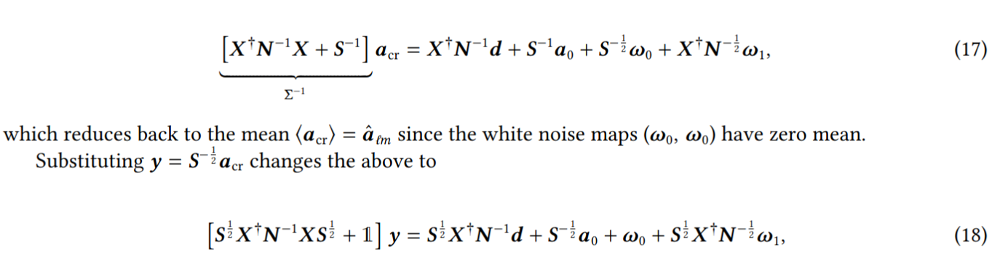

In [50]:
# Construct the right hand side
bdif = construct_rhs(mock_data, 
                     inv_noise_cov, 
                     inv_signal_cov, 
                     omega_0, 
                     omega_1, 
                     a_0, 
                     vis_response, 
                     lsts_hours, 
                     lmax)

# Define left hand side operator 
def dif_lhs_operator(x):
    y = apply_lhs(x,
                  inv_noise_cov, 
                  inv_signal_cov, 
                  vis_response, 
                  lsts_hours, 
                  lmax)
    return y

# Build linear operator object 
dif_lhs_shape = (bdif.size, bdif.size)
dif_linear_op = LinearOperator(matvec = dif_lhs_operator,
                               shape = dif_lhs_shape)

# Run and time solver
t0 = time.time()
x_soln, convergence_info = solver(A = dif_linear_op,
                                  b = bdif,
                                  tol = 1e-06,
                                  maxiter = 4000)
print("Solver took %5.3f sec" % (time.time() - t0))

Solver took 19.787 sec


In [51]:
np.sum(a_0)

0.0

## Solving the linear system $A x = b$

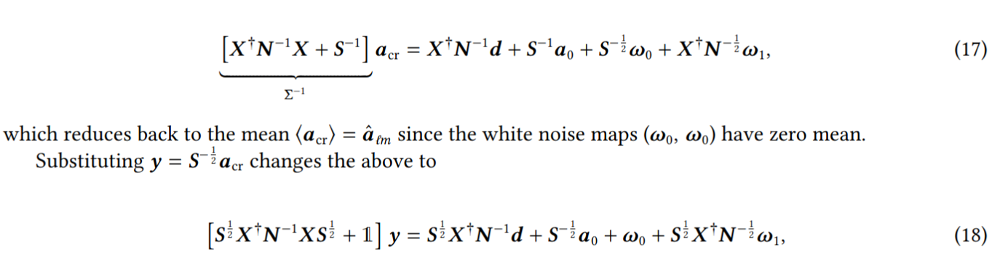

(1) If $N^{-1} \to 0$ and $a_0 = 0$, we get $y = S^{-\frac{1}{2}} a = \omega_0$. Solution looks good in this case!

(2) If $S^{-1} \to 0$, $d = 0$, and $a_0 = 0$, we get $X^\dagger N^{-1} X a = X^\dagger N^{-\frac{1}{2}}\omega_1$, which implies $N^{-\frac{1}{2}} X a = \omega_1$.

In [52]:
### TESTING

# Construct the right hand side
bdif = construct_rhs(mock_data*0., 
                     inv_noise_cov, 
                     inv_signal_cov*0., 
                     omega_0, 
                     np.ones_like(omega_1), 
                     a_0, 
                     vis_response, 
                     lsts_hours, 
                     lmax)

# Define left hand side operator 
def dif_lhs_operator(x):
    y = apply_lhs(x,
                  inv_noise_cov, 
                  inv_signal_cov*0., 
                  vis_response, 
                  lsts_hours, 
                  lmax)
    return y

###########

def dif_lhs_operator2(x):
    return inv_noise_cov * apply_vis_response(x, vis_response, hour_angles, lmax)

# RHS, b vector, simplified
#bdif2 = (np.sqrt(inv_noise_cov)*omega_1).flatten()
#print("bdif2:", bdif2.shape)
###########

"""
# Build linear operator object 
dif_lhs_shape = (bdif.size, bdif.size)
dif_linear_op = LinearOperator(matvec = dif_lhs_operator,
                               shape = dif_lhs_shape)

# Run and time solver
t0 = time.time()
x_soln, convergence_info = solver(A = dif_linear_op,
                                  b = bdif,
                                  tol = 1e-06,
                                  maxiter = 4000)
print("Solver took %5.3f sec" % (time.time() - t0))
"""

#bdif - 
pass

(42,)


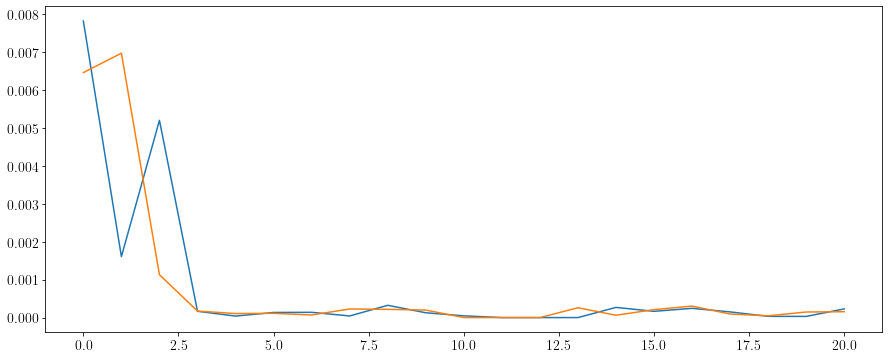

In [53]:
xx1 = np.zeros_like(a_cr)
xx1[0] = 1e0
yy1 = apply_vis_response(xx1, vis_response, hour_angles, lmax)

# apply_vis_response
# (N_times, N_bl, N_freqs) 

yy2 = apply_conjugate(yy1, vis_response, -hour_angles, lmax)
print(yy2.shape)

plt.plot(np.abs(yy2[::2]))
plt.plot(np.abs(yy2[1::2]))
#plt.yscale('log')
plt.gcf().set_size_inches((15., 6.))

In [54]:
_,_,_, index_ell_mode, index_m_mode = ordering(lmax, ell=0, m=0)
index_ell_mode, index_m_mode

([0], [0, 2, 6, 12, 20, 30])

In [55]:
vis_response.shape

(3, 20, 42)

In [56]:
apply_vis_response?

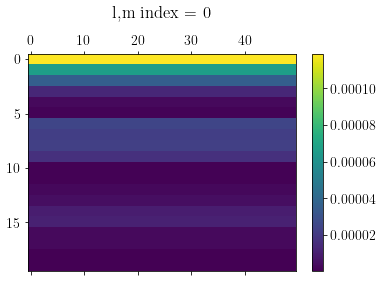

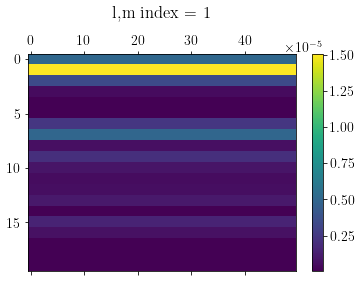

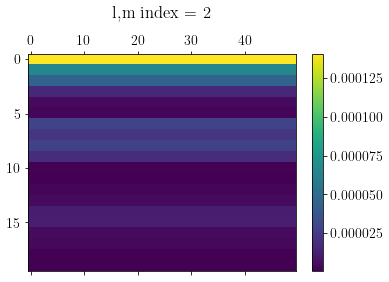

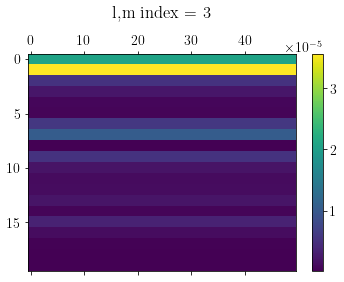

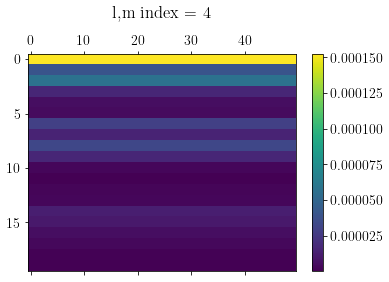

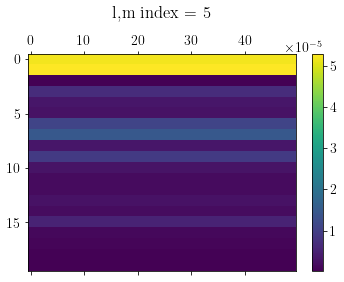

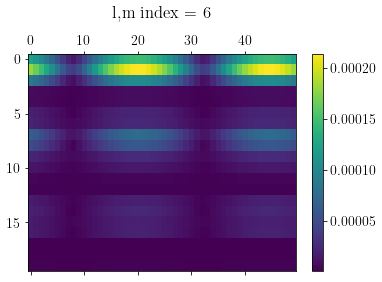

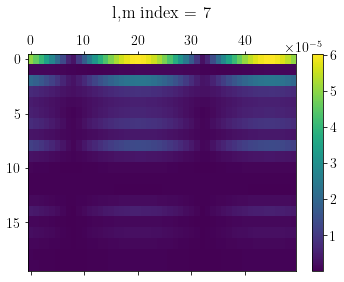

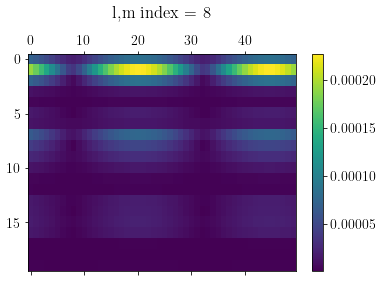

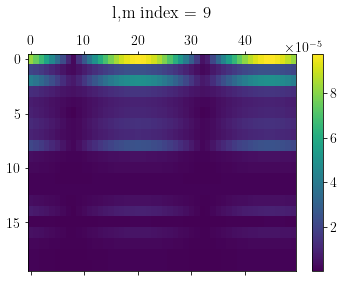

In [57]:
for i in range(10):
    xx1 = np.zeros_like(a_cr)
    xx1[i] = 1e0
    yy1 = apply_vis_response(xx1, vis_response, hour_angles, lmax)
    # yy1: (N_times, N_bl, N_freqs) 
    
    plt.subplot(111)
    plt.matshow(np.abs(yy1[:,1,:]).T, aspect='auto', fignum=False)
    plt.title("l,m index = %d" % i)
    plt.colorbar()
    plt.show()

In [58]:
apply_vis_response(np.ones_like(a_cr), vis_response, hour_angles, lmax)

array([[[-5.61584980e-03+0.00000000e+00j,
         -4.17502272e-03+0.00000000e+00j,
         -4.00137255e-03+0.00000000e+00j, ...,
         -2.46457254e-03+0.00000000e+00j,
         -2.51197031e-03+0.00000000e+00j,
         -2.50642315e-03+0.00000000e+00j],
        [ 7.70879600e-05-1.10043482e-04j,
          1.87241367e-04-3.89500859e-05j,
          8.36738223e-05+4.88500502e-05j, ...,
         -2.19778681e-06-5.77870379e-06j,
          8.82973990e-07-2.96586611e-06j,
          1.24907248e-06-2.10957858e-06j],
        [-5.61584980e-03+0.00000000e+00j,
         -4.17502272e-03+0.00000000e+00j,
         -4.00137255e-03+0.00000000e+00j, ...,
         -2.46457254e-03+0.00000000e+00j,
         -2.51197031e-03+0.00000000e+00j,
         -2.50642315e-03+0.00000000e+00j]],

       [[-5.30603063e-03+0.00000000e+00j,
         -3.98571185e-03+0.00000000e+00j,
         -3.84266830e-03+0.00000000e+00j, ...,
         -2.21784083e-03+0.00000000e+00j,
         -2.26327713e-03+0.00000000e+00j,
         

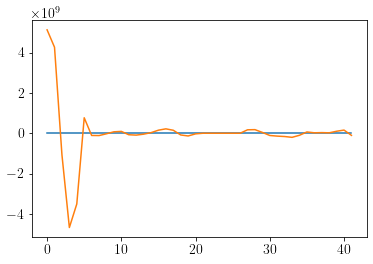

In [59]:
plt.plot(x_soln * np.sqrt(inv_signal_cov) - omega_0)
plt.plot(bdif - omega_0 * np.sqrt(inv_signal_cov))

In [60]:
dif_linear_op(x_soln) - bdif

array([ 1.05853599e+16,  8.75579559e+15, -2.18146837e+15, -9.47340129e+15,
       -7.07309987e+15,  1.53820297e+15, -9.56099811e+17, -9.92194711e+17,
       -2.27894123e+17,  6.11522071e+17,  7.78568199e+17, -7.57100134e+15,
       -9.41371950e+15, -4.65145557e+15,  2.91090748e+15,  1.53847972e+16,
        2.19903140e+16,  1.47829180e+16, -8.63830091e+15, -1.34828047e+16,
       -3.11345974e+15,  2.16150314e+10,  7.48546930e+08, -2.56327380e+10,
       -3.27738609e+09,  2.79623882e+10,  8.66556885e+09,  1.75351335e+16,
        1.81959465e+16,  4.18379351e+15, -1.12142123e+16, -1.42826377e+16,
       -1.65428422e+16, -2.05695951e+16, -1.01637166e+16,  6.36032897e+15,
        2.19295196e+15,  3.13462606e+15,  2.10733401e+15,  1.00015473e+16,
        1.56108160e+16, -1.05255636e+16])

In [61]:
def construct_rhs(data, inv_noise_cov, inv_signal_cov, omega_0, omega_1, a_0, vis_response, lsts_hours, lmax):
    
    hour_angles = lsts_hours/24 
    # inv_signal_cov = 1/signal_cov
    
    # data_term = np.sqrt(signal_cov) * apply_conjugate((inv_noise_cov*data + np.sqrt(inv_noise_cov)*omega_1), vis_response, -hour_angles, lmax)
    # prior_term = np.sqrt(inv_signal_cov)*a_0
    
    data_term = apply_conjugate((inv_noise_cov*data + np.sqrt(inv_noise_cov)*omega_1), vis_response, -hour_angles, lmax)
    prior_term = inv_signal_cov*a_0

    right_hand_side = data_term + prior_term + np.sqrt(inv_signal_cov)*omega_0
    
    return right_hand_side
    

In [62]:
def apply_lhs(a_cr, inv_noise_cov, inv_signal_cov, vis_response, lsts_hours, lmax):
    
    hour_angles = lsts_hours/24 
    # inv_signal_cov = 1/signal_cov
      
    # left_hand_side = np.sqrt(signal_cov) * apply_conjugate((inv_noise_cov * apply_vis_response(a_cr, vis_response, 
    #                                                                                            hour_angles, lmax)), 
    #                                                        vis_response, -hour_angles, lmax) + np.sqrt(inv_signal_cov)*a_cr
    
    left_hand_side = apply_conjugate((inv_noise_cov * apply_vis_response(a_cr, 
                                                                         vis_response, 
                                                                         hour_angles, 
                                                                         lmax)), 
                                     vis_response,
                                     -hour_angles, 
                                     lmax) + inv_signal_cov*a_cr
    
    return left_hand_side

In [63]:
cfg_beam = dict( ref_freq=1.e8,
                     spectral_index=-0.6975,
                     perturb_scale=0.5,
                     mainlobe_width=0.3, 
                     beam_coeffs=[ 0.29778665, -0.44821433, 0.27338272, 
                                  -0.10030698, -0.01195859, 0.06063853, 
                                  -0.04593295,  0.0107879,  0.01390283, 
                                  -0.01881641, -0.00177106, 0.01265177, 
                                  -0.00568299, -0.00333975, 0.00452368,
                                   0.00151808, -0.00593812, 0.00351559
                                 ] )

from hera_sim.beams import PolyBeam, PerturbedPolyBeam

polybeam = PerturbedPolyBeam(mainlobe_scale=1.,
                             xstretch=1.5, 
                             ystretch=1.,
                             rotation=36.,
                             **cfg_beam)

In [64]:
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.

ant_pos = {0: (0., 0., 0.), 
           1: (14., 0., 0.),
           2: (0., 14., 0.),
           #3: (14., 14., 0.),
           #4: (40., 0., 0.),
          }

# (N_bl, N_freqs, N_alms)
#beams = [pyuvsim.AnalyticBeam('gaussian', diameter=10.) for ant in ant_pos]

from hera_pspec.data import DATA_PATH
from pyuvdata import UVBeam
#beamfile = os.path.join(DATA_PATH, 'HERA_NF_dipole_power.beamfits')
#nfbeam = UVBeam()
#nfbeam.read_beamfits(beamfile)
#nfbeam.interpolation_function = "healpix_simple"
#nfbeam.freq_interp_kind = 'linear'

#_lsts = np.linspace(0., 2.*np.pi, 50)
_lsts = np.linspace(0., 0.5, 14)

#beams = [polybeam for ant in ant_pos]
#beams = [nfbeam for ant in ant_pos]
beams = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos]

vis_response = vis_proj_operator_lsts(freqs[:3], _lsts, beams, ant_pos, lmax=5, nside=256, latitude=latitude)
print("SHAPE:", vis_response.shape)
aa = vis_response.reshape((-1, vis_response.shape[-1]))

SHAPE: (6, 3, 14, 42)


In [66]:
aa

array([[ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -2.24604599e-17+0.j, -3.48454519e-17+0.j,
         2.38409486e-17+0.j],
       [ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -3.02934041e-03+0.j, -4.75731385e-03+0.j,
         3.15737735e-03+0.j],
       [ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -5.98712177e-03+0.j, -9.40225046e-03+0.j,
         6.19834719e-03+0.j],
       ...,
       [ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -1.96228408e-02+0.j, -3.08159531e-02+0.j,
         1.41302264e-02+0.j],
       [ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -1.90238813e-02+0.j, -2.98753398e-02+0.j,
         1.22340171e-02+0.j],
       [ 1.34297009e-02+0.j,  1.17040417e-02+0.j, -3.11375787e-03+0.j,
        ..., -1.79755399e-02+0.j, -2.82290114e-02+0.j,
         9.88675894e-03+0.j]])

/tmp/ipykernel_91963/2804073133.py:3: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
/tmp/ipykernel_91963/2804073133.py:15: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')


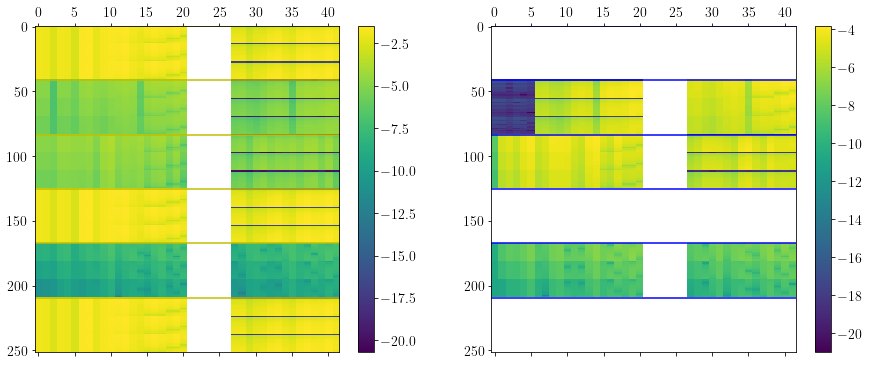

In [70]:
plt.subplot(121)
minmax = np.abs(aa.real).max()
plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='y')

#ell, m = hp.Alm().getlm(lmax=5)    
#for i in range(ell.size):
#    if m[i] == 0.:
#        plt.axvline(2*i+1, ls='dashed', color='m')
plt.colorbar()

plt.subplot(122)
minmax = np.abs(aa.imag).max()
plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='b')
plt.colorbar()

# y axis:
# 3 frequencies per block
# each block is a baseline, ordering 0,0; 0,1; 0,2...; 1,1; 1,2...
# x axis:
# a_lm modes, real and imaginary, in some ordering

plt.gcf().set_size_inches((15., 6.))

In [82]:
# Cut out the modes that are forced to be zero
aa_cut = np.zeros((aa.shape[0], aa.shape[1]-3), dtype=np.complex128)
aa_cut[:,:21] = aa[:,:21]
aa_cut[:,21:] = aa[:,21+3:]

bb = np.matmul(aa_cut.T.conj(), aa_cut)
bb.shape


bb = bb + 0.01 * np.eye(bb.shape[0])

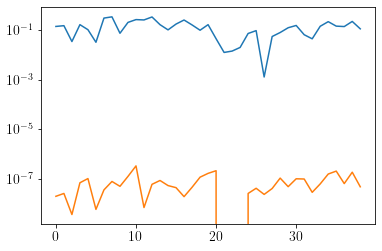

In [83]:
cc = np.matmul(bb, np.random.randn(bb.shape[0]))
plt.plot(np.abs(cc.real))
plt.plot(np.abs(cc.imag))
plt.yscale('log')

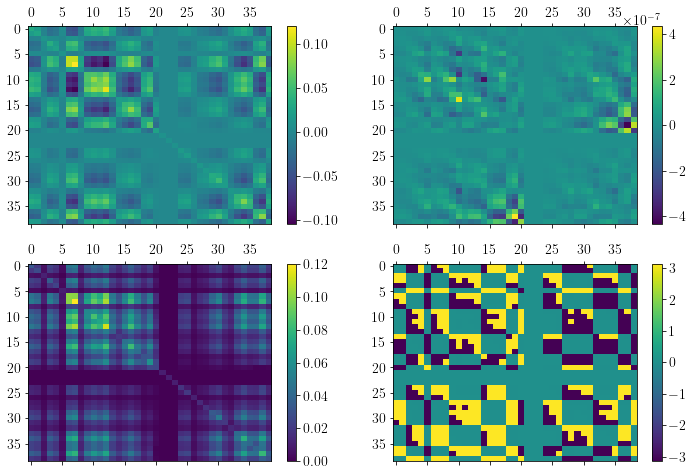

In [84]:
plt.subplot(221)
plt.matshow(bb.real, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(222)
plt.matshow(bb.imag, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(223)
plt.matshow(np.abs(bb), aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(224)
plt.matshow(np.angle(bb), aspect='auto', fignum=False)
plt.colorbar()

plt.gcf().set_size_inches((12., 8.))

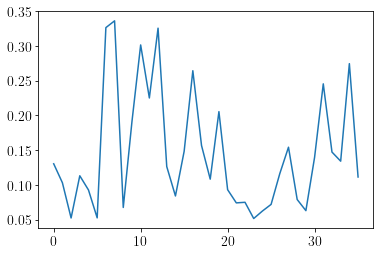

In [97]:
plt.plot(np.diag(bb).real)
#plt.yscale('log')

Condition number: 6.249e+01


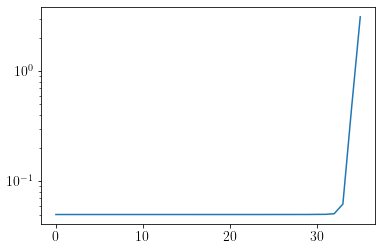

In [98]:
eig, eigv = np.linalg.eigh(bb)

print("Condition number: %5.3e" % np.linalg.cond(bb))

plt.plot(eig)
plt.yscale('log')

divide by zero encountered in log10
divide by zero encountered in log10


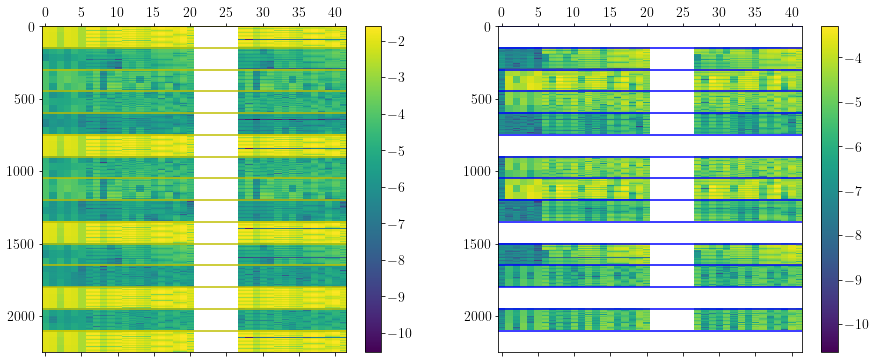

In [65]:
plt.subplot(121)
minmax = np.abs(aa.real).max()
plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='y')

#ell, m = hp.Alm().getlm(lmax=5)    
#for i in range(ell.size):
#    if m[i] == 0.:
#        plt.axvline(2*i+1, ls='dashed', color='m')
plt.colorbar()

plt.subplot(122)
minmax = np.abs(aa.imag).max()
plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='b')
plt.colorbar()

# y axis:
# 3 frequencies per block
# each block is a baseline, ordering 0,0; 0,1; 0,2...; 1,1; 1,2...
# x axis:
# a_lm modes, real and imaginary, in some ordering

plt.gcf().set_size_inches((15., 6.))

In [222]:
ell[11], m[11]

(2, 2)

In [ ]:
idx = 0, ell = 0, m = 0   yn
idx = 2, ell = 1, m = 0   yn
idx = 4, ell = 2, m = 0   ny
idx = 6, ell = 3, m = 0   ny
idx = 8, ell = 1, m = 1   nn
idx = 10, ell = 2, m = 1  xx
idx = 12, ell = 3, m = 1  xx
idx = 14, ell = 2, m = 2  ny
idx = 16, ell = 3, m = 2  ny
idx = 18, ell = 3, m = 3  nn


idx = 0, ell = 0, m = 0
idx = 2, ell = 1, m = 0
idx = 4, ell = 2, m = 0
idx = 6, ell = 3, m = 0
idx = 8, ell = 4, m = 0
idx = 10, ell = 5, m = 0
idx = 12, ell = 1, m = 1
idx = 14, ell = 2, m = 1
idx = 16, ell = 3, m = 1
idx = 18, ell = 4, m = 1
idx = 20, ell = 5, m = 1
idx = 22, ell = 2, m = 2
idx = 24, ell = 3, m = 2
idx = 26, ell = 4, m = 2
idx = 28, ell = 5, m = 2
idx = 30, ell = 3, m = 3
idx = 32, ell = 4, m = 3
idx = 34, ell = 5, m = 3
idx = 36, ell = 4, m = 4
idx = 38, ell = 5, m = 4
idx = 40, ell = 5, m = 5


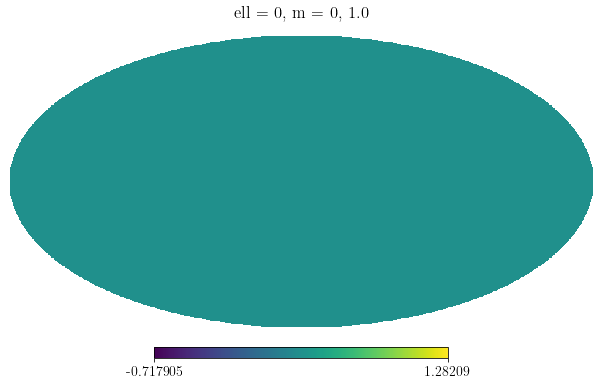

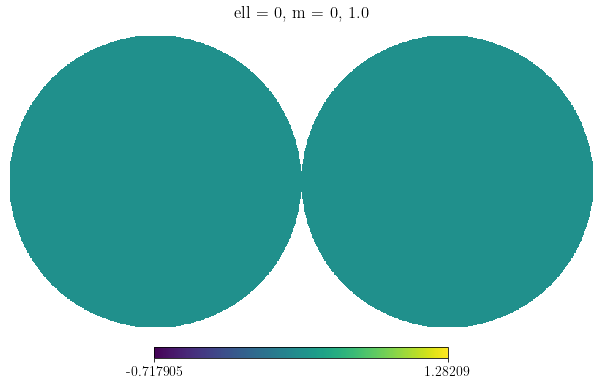

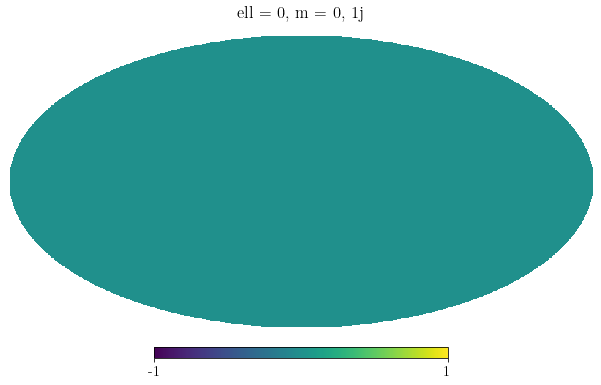

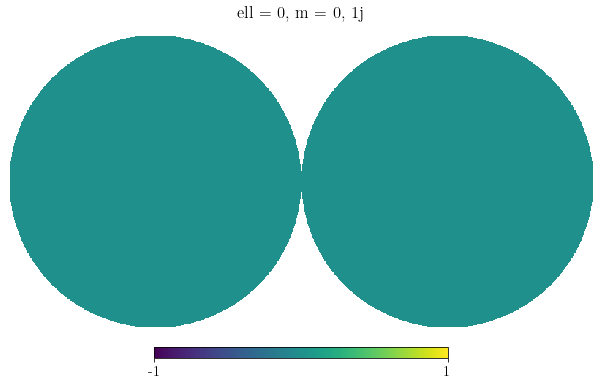

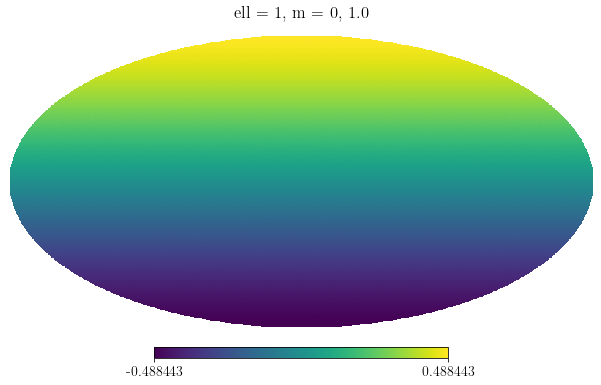

...

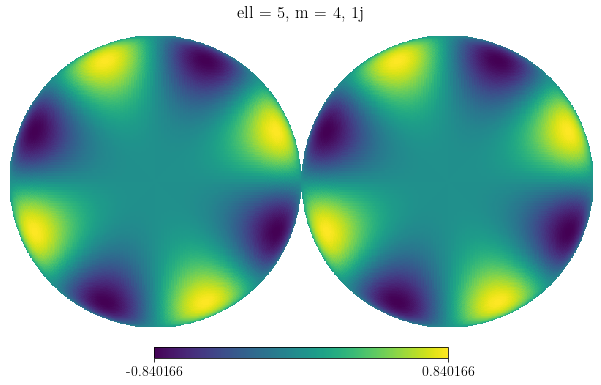

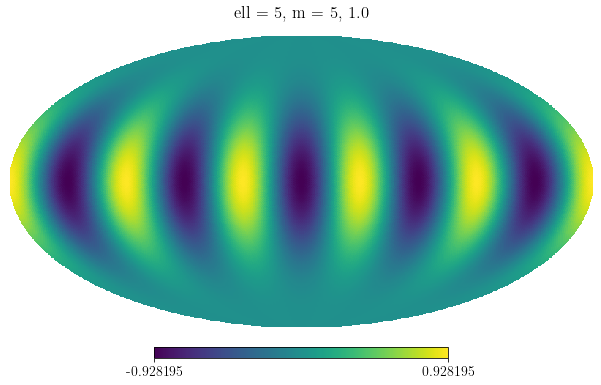

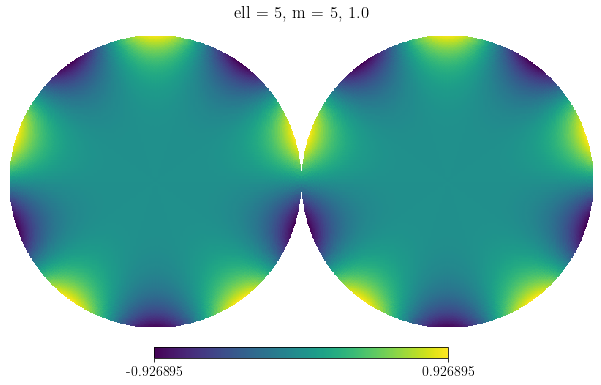

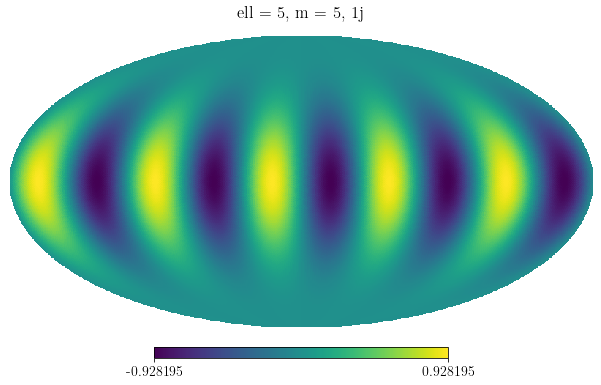

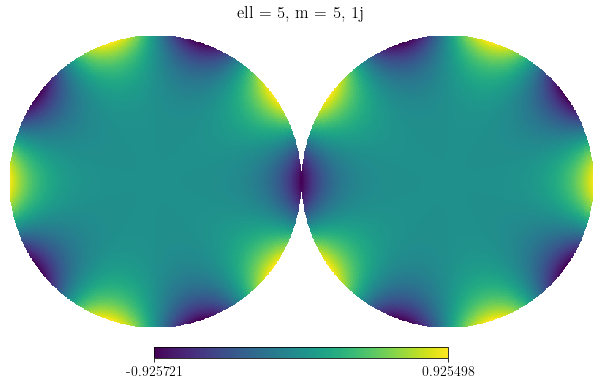

In [217]:
import healpy as hp
# Loop over (ell, m) modes, weighting the precomputed visibility sim
# by the value of each spherical harmonic mode in each pixel

# Array of ell, m values in healpy ordering
ell, m = hp.Alm().getlm(lmax=5)
for n in range(ell.size):
    print("idx = %d, ell = %d, m = %d" % (2*n, ell[n], m[n]))

alm = np.zeros(ell.size, dtype=np.complex128)
for n in range(ell.size):

    # Start with zero vector for all modes
    alm *= 0

    # Loop over real, imaginary values for this mode only
    for j, val in enumerate([1., 1.j]):

        # Make healpix map for this mode only
        alm[n] = val
        skymap = hp.alm2map(alm, nside=nside) #* pix_area
        
        hp.mollview(skymap)
        plt.title("ell = %d, m = %d, %s" % (ell[n], m[n], val))
        plt.show()
        
        hp.orthview(skymap, rot=(0., 90., 0.))
        plt.title("ell = %d, m = %d, %s" % (ell[n], m[n], val))
        plt.show()

divide by zero encountered in log10


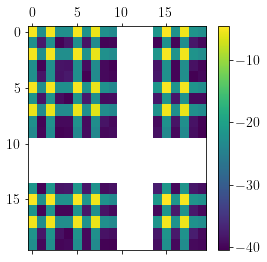

In [193]:
Amat = aa.conj().T @ aa
plt.matshow(np.log10(np.abs(Amat)), aspect='auto')
plt.colorbar()

In [57]:
dif_linear_op(a_cr) - bdif

array([ 2.05150680e+06, -1.78819744e-01,  2.34181787e+06,  2.09596249e-03,
        1.91832660e+05,  1.80021390e-01, -6.72591138e+03, -2.71371313e-02,
        6.36194739e+05,  4.36500527e-02,  2.58409943e+05, -3.00759343e-01,
        4.16440322e+04, -2.57068519e-01,  3.05318446e+05, -1.11284403e-01,
        2.84150553e-01,  7.13318000e+05, -3.71134251e-01, -4.10349125e+05,
        4.94432070e-01, -8.27206531e+05, -6.65175410e-02,  9.46175156e+05,
       -2.80922813e-01,  1.75801159e+06, -2.47873038e-02,  7.33671188e+05,
        6.78119972e-02,  1.32598484e+05,  6.68292972e-02, -7.51017079e+05,
       -3.31770741e-02, -1.35687678e+06, -3.27118270e-01,  2.16102374e+05,
       -1.00052497e-01,  1.30378628e+06, -3.14118066e-01,  4.26340213e+05,
       -1.65057888e-01, -2.78545021e+05,  2.34858340e-01, -1.82077599e+05,
        2.01147785e-01,  5.31744097e-02, -1.12856738e+06, -7.80424841e-02,
       -1.83753769e+06,  3.68550645e-02, -1.02949500e+06, -7.22735510e-02,
        3.01957212e+05, -

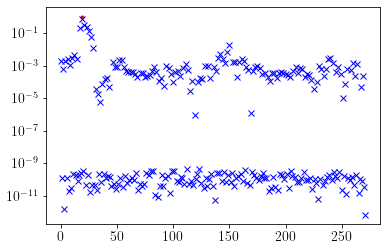

In [59]:
plt.plot(np.abs(a_cr), 'r.')
plt.plot(np.abs(x_soln), 'bx')
plt.yscale('log')

In [51]:
convergence_info

0

In [52]:
soln = hp.alm2map(alms2healpy(x_soln),nside)
map_plot(soln, 'x_soln', 'test_figures/x_soln')

RuntimeError: latex was not able to process the following string:
b'x_soln'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/phil/.cache/matplotlib/tex.cache/8908692399e2ce777c7f712952e6f29d.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texmf/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 8908692399e2ce777c7f712952e6f29d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.19 {\rmfamily x_
                  soln}
No pages of output.
Transcript written on 8908692399e2ce777c7f712952e6f29d.log.




RuntimeError: latex was not able to process the following string:
b'x_soln'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/phil/.cache/matplotlib/tex.cache/8908692399e2ce777c7f712952e6f29d.tex
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texmf/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 8908692399e2ce777c7f712952e6f29d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.19 {\rmfamily x_
                  soln}
No pages of output.
Transcript written on 8908692399e2ce777c7f712952e6f29d.log.




<Figure size 720x432 with 1 Axes>

In [ ]:
map_mock_alms = hp.alm2map(alms2healpy(mock_alms),nside)
map_plot(map_mock_alms, 'x_true', 'test_figures/map_x_true')


In [ ]:
# discrete_log_map_plot((map_mock_alms-soln), 'Residual map: x_true - x_soln')

residual_map = hp.alm2map(alms2healpy(mock_alms)-alms2healpy(x_soln),nside)
discrete_log_map_plot(residual_map, 
                      'Residual map: np.log10(np.abs(x_true - x_soln))', 
                      'test_figures/log10map')

In [ ]:
X_x_true = apply_vis_response(mock_alms, 
                             vis_response, 
                             hour_angles, 
                             lmax)

X_x_soln = apply_vis_response(x_soln, 
                             vis_response, 
                             hour_angles, 
                             lmax)

In [ ]:
X_x_true[:,:,:].shape

In [ ]:
waterfall_plot?

In [ ]:
bl = 1

data_sets = {'X_x_true':X_x_true,
             'X_x_soln':X_x_soln}

for key, data_set in data_sets.items():
    waterfall_plot(data_set, 
               bl,
               freqs,
               lsts_hours,
               f"{key}:\n l,m = ({ell_val},{m_val}), bl={antpairs[bl]}, lmax={lmax}, nside={nside}",
               f'test_figures/{key}')


### Does A x_soln = b hold up?  [ NO ]

In [ ]:
Ax_soln = apply_lhs(x,
                    inv_noise_cov, 
                    inv_signal_cov, 
                    vis_response, 
                    lsts_hours, 
                    lmax)

In [ ]:
Axb = np.abs(Ax_soln - bdif)

In [3]:
bar_plot(Axb, r'$|A\, x_{soln} - b|$', 'test_figures/test1/Ax=b')

NameError: name 'bar_plot' is not defined

# Test_script runs

In [ ]:
def test_script(directory):
    # Create a directory for the test
    path = f'./test_figures/{directory}/'
    if not os.path.isdir(path): os.makedirs(path)
    
    # Solver and resolution
    solver = cg #conjugated gradients
    lmax = 15
    nside = 64
    
    # Antennas and beams
    ant_pos = {0: (0., 0., 0.), 
               1: (28., 0., 0.)}
    ants = list(ant_pos.keys())
    antpairs = []  #used for waterfall plots title
    for i in ants:
        for j in ants:
            if j >= i:
                antpairs.append((ants[i],ants[j]))

    beam_width = 8. # If beam is uniform, this won't change anything
    beam_type = 'uniform'#'airy'
    beams = [pyuvsim.AnalyticBeam(beam_type, diameter=beam_width) for ant in ants]
    freqs=np.linspace(100e6, 200e6, 20)

    # One reference lst (there's no thought put into this choice) 
    lst_ref = 1.
    
    # Latitude
    # Default is HERAs: -30.7215 * np.pi / 180 = -0.5361913261514378
    latitude = (-30.7215 + 30.) * np.pi / 180 

    # Time of rotation given as fraction of a sidereal day
    lsts_hours = np.linspace(0.,24,50)          # in hours for easy setting
    hour_angles = lsts_hours/24         # in decimal numbers, used by wigner part
    # lsts = np.deg2rad(hour_angles*360)  # in radian, used by HYDRA 
    
    
    # Set up x_true to test script on
    nmodes_healpy = lmax * (2 * lmax + 1 - lmax) // 2 + lmax + 1  
    nalms = 2*nmodes_healpy

    ell_val = 2
    m_val = [1,2]
    mode_amplitude = 1
        
    mode_index_0 = get_healpy_index_from_lm(ell_val,m_val[0],lmax)
    x_true_0 = create_alms(mode_index_0,lmax) * mode_amplitude
    mode_index_1 = get_healpy_index_from_lm(ell_val,m_val[1],lmax)
    x_true_1 = create_alms(mode_index_1,lmax) * mode_amplitude
    # mode_index_2 = get_healpy_index_from_lm(ell_val,m_val[2],lmax)
    # x_true_2 = create_alms(mode_index_2,lmax) * mode_amplitude
    mode_index = [mode_index_0, mode_index_1]#, mode_index_2]
    
    x_true = x_true_0 + x_true_1
    
    ## Produce and save x_true map plot
    # x_soln maps:
    map_x_true = hp.alm2map(alms2healpy(x_true),nside)
    map_plot(map_x_true, 'x_true', path+'map_x_true')
    
    # Run visibility response function and create mock data
    vis_response = vis_proj_operator(freqs, 
                                     lst_ref, 
                                     beams, 
                                     ant_pos, 
                                     lmax, 
                                     nside,
                                     latitude)

    mock_data = apply_vis_response(x_true, 
                                   vis_response, 
                                   hour_angles, 
                                   lmax)
    
    
    ## Set up solver
    inv_noise_cov = 1/(np.ones_like(mock_data, dtype=np.complex128)*(1e-10**2))
    prior_value = 4.
    signal_cov = np.ones_like(x_true)*(prior_value**2)
    inv_signal_cov = 1/signal_cov
    a_0 = np.zeros_like(x_true)
    
    np.random.seed(10)
    dim0, dim1, dim2 = mock_data.shape

    omega_0 = np.random.randn(x_true.size)
    omega_1 = (np.random.randn(dim0, dim1, dim2) + 1.j*np.random.randn(dim0, dim1, dim2))/np.sqrt(2)

    #### Print out all parameters before run, in case it has to be terminated
    # Save parameter and convergence info   
    params = open(path+"output.txt", "w")
    params.write("PARAMETERS USED IN THIS RUN:\n\n")
    params.write(f"nside = {nside}, lmax = {lmax}\n")
    params.write(f"ants = {ant_pos}\n")
    params.write(f"latitude = {latitude*180/np.pi}\n")
    params.write(f"beam width = {beam_width} and beam type = {beam_type}\n")
    params.write(f"freqs = {freqs.min()/1e+06} MHz to {freqs.max()/1e+06} MHz in {freqs.size} steps\n")
    params.write(f"lsts = {lsts_hours.min()} Hrs to {lsts_hours.max()} Hrs in {lsts_hours.size} steps\n")
    params.write(f"(ell, m) = {ell_val}, {m_val} with mode ({mode_index}) = {mode_amplitude}\n")
    params.write(f"Prior (S) is set to {prior_value}^2\n")
    params.close()
    
    
    ## Run solver
    # Construct the right hand side
    bdif = construct_rhs(mock_data, 
                         inv_noise_cov, 
                         inv_signal_cov, 
                         omega_0, 
                         omega_1, 
                         a_0, 
                         vis_response, 
                         lsts_hours, 
                         lmax)

    # Define left hand side operator 
    def dif_lhs_operator(x):
        y = apply_lhs(x,
                      inv_noise_cov, 
                      inv_signal_cov, 
                      vis_response, 
                      lsts_hours, 
                      lmax)
        return y

    # Build linear operator object 
    dif_lhs_shape = (bdif.size, bdif.size)
    dif_linear_op = LinearOperator(matvec = dif_lhs_operator,
                                   shape = dif_lhs_shape)

    # Run and time solver
    t0 = time.time()
    x_soln, convergence_info = solver(A = dif_linear_op,
                                      b = bdif,
                                      tol = 1e-06,
                                      maxiter = 4000)
    t1 = time.time() - t0
    print("Solver took %5.3f sec" % (t1))
    print(f'convergence_info={convergence_info}')
    
    ## Produce and save plots   
    # x_soln maps:   
    map_x_soln = hp.alm2map(alms2healpy(x_soln),nside)
    map_plot(map_x_soln, 'x_soln', path+'map_x_soln')
    
    # Log residual map:
    residual_map = hp.alm2map(alms2healpy(x_true)-alms2healpy(x_soln),nside)
    discrete_log_map_plot(residual_map, 
                          'Residual map: np.log10(np.abs(x_true - x_soln))', 
                          path+'log10map')
    
    # Waterfall plots of 'visibilities' Xx:
    X_x_true = apply_vis_response(mock_alms, 
                             vis_response, 
                             hour_angles, 
                             lmax)

    X_x_soln = apply_vis_response(x_soln, 
                             vis_response, 
                             hour_angles, 
                             lmax)
    
    bl = 1
    data_sets = {'X_x_true':X_x_true,
                 'X_x_soln':X_x_soln}
    
    for key, data_set in data_sets.items():
        waterfall_plot(data_set, 
                       bl,
                       freqs,
                       lsts_hours,
                       f"{key}:\n l,m = ({ell_val},{m_val}),\
                                         bl={antpairs[bl]}, \
                                         lmax={lmax}, \
                                         nside={nside}",
                       f'{path}{key}')
    
    # Bar plot of |Ax - B|:
    Ax_soln = apply_lhs(x_soln,
                    inv_noise_cov, 
                    inv_signal_cov, 
                    vis_response, 
                    lsts_hours, 
                    lmax)
    
    bar_plot(np.abs(Ax_soln - bdif), r'$|A\, x_{soln} - b|$', path+'Ax=b')
    
    params = open(path+"output.txt", "a")
    params.write(f"\n\nCONVERGENCE INFO:\n\n")
    params.write(f"The solver took {t1} seconds to run \n")
    if convergence_info == 0:
        params.write(f"The solver converged with convergence_info = {convergence_info}\n")
    else:
        params.write(f"The solver stopped af {convergence_info} iterations\n")
    params.close()
    
    # Save the true and solution vector
    x_true_out = open(path+"x_true.txt", "w")
    x_true_out.write(f"{x_true}")
    x_true_out.close()
    
    x_soln_out = open(path+"x_soln.txt", "w")
    x_soln_out.write(f"{x_soln}")
    x_soln_out.close()
    
    return

In [ ]:
test_script('test30')

# Work book /note book: 

## Test that linear solver retrieved the same a_cr as was put in, when simplified

rhs has to be "the same", i.e. signal_cov, omega_0, omega_1 = "0" 

In [4]:
omega_0_zeros = np.zeros_like(mock_alms)
omega_1_zeros = np.zeros_like(mock_data, dtype=np.complex128)

NameError: name 'mock_alms' is not defined

In [ ]:
inv_signal_cov_zeros = np.zeros_like(mock_alms)

In [ ]:
# Construct the right hand side
bdif_0 = construct_rhs(mock_data, 
                     inv_noise_cov, 
                     inv_signal_cov_zeros, 
                     omega_0_zeros, 
                     omega_1_zeros, 
                     a_0, 
                     vis_response, 
                     lsts_hours, 
                     lmax)

# Define left hand side operator 
def dif_lhs_operator(x):
    y = apply_lhs(x,
                  inv_noise_cov, 
                  inv_signal_cov_zeros, 
                  vis_response, 
                  lsts_hours, 
                  lmax)
    return y

# Build linear operator object 
dif_lhs_shape = (bdif_0.size, bdif_0.size)
dif_linear_op_0 = LinearOperator(matvec = dif_lhs_operator,
                               shape = dif_lhs_shape)

# Run and time solver
t0 = time.time()
x_soln_0, convergence_info = solver(A = dif_linear_op_0,
                                    b = bdif_0,
                                    tol = 1e-06,
                                    maxiter = 4000)
print("Solver took %5.3f sec" % (time.time() - t0))

In [5]:
convergence_info

NameError: name 'convergence_info' is not defined

In [ ]:
map_mock_alms = hp.alm2map(alms2healpy(mock_alms),nside)
map_plot(map_mock_alms, 'x_true; map from original $a_{lm}$', 'figures/x_true')

simplified_soln = hp.alm2map(alms2healpy(x_soln_0),nside)
map_plot(simplified_soln, 'Simplified test solution', 'figures/simplified_soln')

Pasted in figure with `inv_noise_cov = 1/(np.ones_like(mock_data, dtype=np.complex128)*(1e-05**2))`

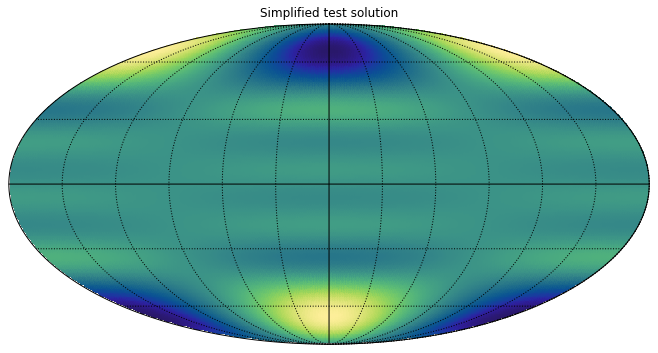

Patsed in figure with `tol = 1e-06`

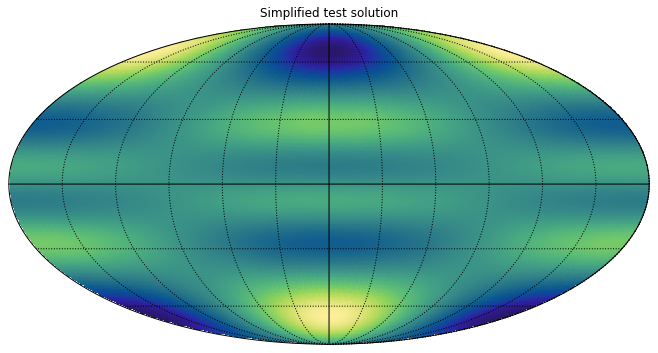!

In [6]:
Ax = apply_lhs(x_soln_0, 
                         inv_noise_cov,
                         inv_signal_cov_zeros,
                         vis_response,
                         lsts_hours,
                         lmax)
abs_diff = np.abs(Ax-bdif_0)
np.isclose(abs_diff,0)
# abs_diff

NameError: name 'apply_lhs' is not defined

In [ ]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(9,5))
plt.axes(ax1)

plt.title('Double length. real arrays')
plt.scatter(mock_alms,x_soln_0)
plt.xlabel('x_true')
plt.ylabel('x_soln')

fig.savefig(f'scatter_double_real.png', bbox_inches='tight', dpi=fig.dpi)


#####################
fig, (ax1) = plt.subplots(ncols=1, figsize=(9,5))
plt.axes(ax1)

plt.title('Real part only')
plt.scatter(mock_alms[:mock_alms.size//2],x_soln_0[:x_soln_0.size//2])

plt.xlabel('x_true')
plt.ylabel('x_soln')

fig.savefig(f'scatter_real_only.png', bbox_inches='tight', dpi=fig.dpi)


#################
fig, (ax1) = plt.subplots(ncols=1, figsize=(9,5))
plt.axes(ax1)

plt.title('imag part only')
plt.scatter(mock_alms[mock_alms.size//2:],x_soln_0[x_soln_0.size//2:])

plt.xlabel('x_true')
plt.ylabel('x_soln')

fig.savefig(f'scatter_imag_only.png', bbox_inches='tight', dpi=fig.dpi)

### Still doesn't work. Let's try with NO rotations / one time only

In [7]:
# Time of rotation given as fraction of a sidereal day
lsts_hours_no_rot = np.zeros(1) #np.linspace(0.,1,1)          # in hours for easy setting
hour_angles_no_rot = lsts_hours_no_rot/24         # in decimal numbers, used by wigner part
# lsts = np.deg2rad(hour_angles*360)  # in radian, used by HYDRA 

t0 = time.time()
vis_response_no_rot = vis_proj_operator(freqs, 
                                 0, 
                                 beams, 
                                 ant_pos, 
                                 lmax, 
                                 nside)

mock_data_no_rot = apply_vis_response(mock_alms, 
                               vis_response_no_rot, 
                               hour_angles_no_rot, 
                               lmax)

print("Run took %5.3f sec" % (time.time() - t0))

NameError: name 'time' is not defined

In [ ]:
inv_noise_cov = 1/(np.ones_like(mock_data_no_rot, dtype=np.complex128)*(1e-10**2))

signal_cov = np.ones_like(mock_alms)*(4**2)
inv_signal_cov = 1/signal_cov

a_0 = np.zeros_like(mock_alms)

np.random.seed(10)
dim0, dim1, dim2 = mock_data_no_rot.shape

omega_0 = np.random.randn(mock_alms.size)
omega_1 = (np.random.randn(dim0, dim1, dim2) + 1.j*np.random.randn(dim0, dim1, dim2))/np.sqrt(2)

In [ ]:
test = apply_lhs(mock_alms,
                inv_noise_cov, 
                inv_signal_cov, 
                vis_response_no_rot, 
                lsts_hours_no_rot, 
                lmax)

In [ ]:
# fig = plt.figure(figsize=(10,10))
# plt.imshow((vis_response[:,:,mode_index].T.real), extent=[min(freqs),max(freqs),max(lsts_hours_no_rot),min(lsts_hours_no_rot)], aspect="auto")
# plt.colorbar()

# plt.title(f"Mock data with no rotation\n l,m = ({ell_val},{m_val}), bl={antpairs[1]} \nlmax={lmax}, nside=64")
# plt.xlabel(r"Frequency [MHz] $\phi$")
# plt.ylabel("LST [Hr]")
# fig.savefig(f'mock_data_no_rotations.png', transparent=False, dpi=fig.dpi)

In [8]:
# Construct the right hand side
bdif_no_rot = construct_rhs(mock_data_no_rot, 
                     inv_noise_cov, 
                     inv_signal_cov, 
                     omega_0, 
                     omega_1, 
                     a_0, 
                     vis_response_no_rot, 
                     lsts_hours_no_rot, 
                     lmax)

# Define left hand side operator 
def dif_lhs_operator(x):
    y = apply_lhs(x,
                  inv_noise_cov, 
                  inv_signal_cov, 
                  vis_response_no_rot, 
                  lsts_hours_no_rot, 
                  lmax)
    return y

# Build linear operator object 
dif_lhs_shape_no_rot = (bdif_no_rot.size, bdif_no_rot.size)
dif_linear_op_no_rot = LinearOperator(matvec = dif_lhs_operator,
                               shape = dif_lhs_shape_no_rot)

# Run and time solver
t0 = time.time()
x_soln_no_rot, convergence_info = solver(dif_linear_op_no_rot, bdif_no_rot)
print("Solver took %5.3f sec" % (time.time() - t0))



NameError: name 'construct_rhs' is not defined

In [ ]:
soln_no_rot = hp.alm2map(alms2healpy(x_soln_no_rot),nside)
map_plot(soln_no_rot, 'x_soln_no_rotations', 'figures/no_rotations')

## Something is wrong. Let's also just test if "backwards" rotations work
## They do!

In [ ]:
rotated_alms = np.zeros(shape=(mock_alms.size,hour_angles.size))

for i in range(hour_angles.size):
    mock_modes = alms2modes(mock_alms,lmax)

    D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angles[i]), lmax)
    rotated_modes = apply_D_matrix(D_matrix, mock_modes, lmax)
    rotated_alms[:,i] = modes2alms(rotated_modes,lmax)

In [9]:
back_alms = np.zeros(shape=(mock_alms.size,hour_angles.size))

for i in range(hour_angles.size):
    rotated_modes = alms2modes(rotated_alms[:,i],lmax)
    
    D_matrix = combined_D_matrix(D_matrix_1D(lmax, -hour_angles[i]), lmax)
    back_modes = apply_D_matrix(D_matrix, rotated_modes, lmax)
    back_alms[:,i] = modes2alms(back_modes,lmax)

NameError: name 'mock_alms' is not defined

In [ ]:
averaged_back_alms = np.sum(back_alms, axis=1)/hour_angles.size


In [ ]:
# has = 0.

# mock_modes = alms2modes(mock_alms,lmax)

# D_matrix = combined_D_matrix(D_matrix_1D(lmax, has), lmax)
# rotated_modes = apply_D_matrix(D_matrix, mock_modes, lmax)
# no_rot_alms = modes2alms(rotated_modes,lmax)

has = np.zeros(1)

no_rot_alms = np.zeros(shape=(mock_alms.size,has.size))

for i in np.arange(has.size):
    mock_modes = alms2modes(mock_alms,lmax)

    D_matrix = combined_D_matrix(D_matrix_1D(lmax, has[i]), lmax)
    no_rot_modes = apply_D_matrix(D_matrix, mock_modes, lmax)
    no_rot_alms[:,i] = modes2alms(rotated_modes,lmax)
    
no_rot_alms_avg = np.sum(no_rot_alms, axis=1)/has.size

In [ ]:
map_mock_alms = hp.alm2map(alms2healpy(mock_alms),nside)
map_plot(map_mock_alms, 'Map from mock alms', 'figures/x_true')

map_rotated_alms = hp.alm2map(alms2healpy(rotated_alms[:,10]),nside)
map_plot(map_rotated_alms, 'Map from rotated alms', 'figures/rotated_alms')

map_back_alms = hp.alm2map(alms2healpy(back_alms[:,10]),nside)
map_plot(map_back_alms, 'Map from alms rotated back', 'figures/alms_rotated_back')

map_no_rot_alms = hp.alm2map(alms2healpy(no_rot_alms_avg),nside)
map_plot(map_no_rot_alms, 'Map alms rotated by 0', 'alms_rotated_0_hrs')

## Creating the "opposite" function (X d -> alms)

From Phil:

```
def precompute_op(vis_proj_operator, inv_noise_var):
    """
    Precompute the real and imaginary blocks of the matrix operator
    (v^T N^-1 v), which is the most expensive component of the LHS operator of
    the linear system.
    Parameters:
        vis_proj_operator (array_like):
            The projection operator from source amplitudes to visibilities,
            from `calc_proj_operator`.
        inv_noise_var (array_like):
            Inverse noise variance array, with the same shape as the visibility
            data 
    Returns:
        vsquared (array_like):
            The sum of the real and imaginary blocks of the matrix operator
            (v^T_re N^-1 v_re + v^T_im N^-1 v_im), which has shape
            (Nsrcs, Nsrcs).
    """
    nalms = vis_proj_operator.shape[-1]
    v = vis_proj_operator * np.sqrt(inv_noise_var)[:, :, :, np.newaxis]  

    # Treat real and imaginary separately, and get copies, to massively
    # speed-up the matrix multiplication!
    v_re = v.reshape((-1, nsrcs)).real.copy()
    v_im = v.reshape((-1, nsrcs)).imag.copy()
    return v_re.T @ v_re + v_im.T @ v_im
```

This doesn't easily apply to mine though, since I don't have one full X-operator, but calcualtes it in steps. Instead: Let's go back to working backwards step by step:

In [10]:
vis_response.conj().T.shape

NameError: name 'vis_response' is not defined

In [ ]:
test = np.ones((272))
test.shape

In [ ]:
mock_inv_noise = np.ones((visibility.shape))
mock_inv_noise.shape

In [11]:
times = -np.flip(hour_angles)   

alms_retrieved = np.zeros((nalms,times.size), dtype=np.complex128)
for j in range(nalms):
    for i in range(3):  ## this is not right
        alms_retrieved[j,:] = (visibility[:,i,:] @ vis_response.T[j,:,i])

alms = np.zeros((nalms,times.size))
for i in range(times.size):
    mode = alms2modes(alms_retrieved[:,i], lmax)
    
    D_matrix = combined_D_matrix(D_matrix_1D(lmax, times[i]), lmax)
    rotated_back = apply_D_matrix(D_matrix, mode, lmax)
    
    alms[:,i] = modes2alms(rotated_back, lmax)

NameError: name 'hour_angles' is not defined

In [ ]:
#alms[:,:3]

## Waterfall plots: Comparison to `simulate_vis_per_alm`:

In [ ]:
lmax = 5
nside = 256

In [12]:
ant_pos = {0: (0., 0., 0.), 
           1: (14., 0., 0.)}
ants = list(ant_pos.keys())

beams = [pyuvsim.AnalyticBeam('airy', diameter=8.) for ant in ants]
freqs=np.linspace(50e6, 150e6, 20)

# One reference lst 
lst_ref = 0.

# Time of rotation given as fraction of a sidereal day
#hour_angles = np.linspace(0, 1, 50)# * units.hour

NameError: name 'pyuvsim' is not defined

In [ ]:
ell_val = 4
m_val = 1
mode_index = get_healpy_index_from_lm(ell_val,m_val,lmax)
plot_alms = create_alms(mode_index,lmax)

lsts_hours = np.linspace(0.,10,15)          # in hours for easy setting
hour_angle_decimals = lsts_hours/24         # in decimal numbers, used by wigner part
lsts = np.deg2rad(hour_angle_decimals*360)  # in radian, used by HYDRA 

## Using `simulate_vis_per_alm`s internal LST times

In [ ]:
antpairs = []
for i in ants:
    for j in ants:
        if j >= i:
            antpairs.append((ants[i],ants[j]))

In [ ]:
t0 = time.time()
ell, m, vis_alm = hydra.vis_simulator.simulate_vis_per_alm(lmax=lmax, 
                                                           nside=64, 
                                                           ants=ant_pos, 
                                                           freqs=freqs, 
                                                           lsts=lsts, #in radians. Range is [0, 2 pi].
                                                           beams=beams)


print("Run took %5.3f sec" % (time.time() - t0))

In [13]:
vis_response = np.zeros((len(antpairs), len(freqs), len(lsts), 2*len(ell)), dtype=np.complex128)

for i, bl in enumerate(antpairs):
    idx1 = ants.index(bl[0])
    idx2 = ants.index(bl[1])
    vis_response[i, :, :, :] = vis_alm[:, :, idx1, idx2, :]  # N_bl, N_freqs, N_lsts, N_alms

NameError: name 'antpairs' is not defined

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.imshow((vis_response[1,:,:,mode_index].T.real), extent=[min(freqs),max(freqs),max(lsts_hours),min(lsts_hours)], aspect="auto")
plt.colorbar()

plt.title(f"Visibilities using Hydras internal lst-rotation \n l,m = ({ell_val},{m_val}), bl={antpairs[1]} \nlmax={lmax}, nside=64")
plt.xlabel(r"Frequency [MHz] $\phi$")
plt.ylabel("LST [Hr]")
fig.savefig(f'hydra_vis_sim.png', transparent=False, dpi=fig.dpi)
# print(f"Tick mark issues. \n\nThis is for LST = \n{lsts} \n\n and frequencies = \n{freqs}")

## Using my `vis_proj_operator()` and `apply_vis_response()`

In [ ]:
# plot_modes=alms2modes(plot_alms,lmax)

# rotated_modes = np.zeros((hour_angle_decimals.size, plot_modes.size), dtype=np.complex128)
# for i in range(hour_angle_decimals.size):
#     D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angle_decimals[i]), lmax)
#     rotated_modes[i,:] = apply_D_matrix(D_matrix, plot_modes, lmax)

In [14]:
# for mode in rotated_modes:
#     print(all(((mode - plot_modes.ndarray)) <= 1e-06))

In [15]:
t0 = time.time()
vis_response_ref = vis_proj_operator(freqs, lst_ref, beams, ant_pos, lmax, nside)
visibility = apply_vis_response(plot_alms, vis_response_ref, hour_angle_decimals, lmax)
print("Run took %5.3f sec" % (time.time() - t0))

NameError: name 'time' is not defined

In [ ]:
fig = plt.figure(figsize=(10,10))
axes = fig.add_subplot(111)

caxes = axes.imshow((visibility[:,1,:].real), extent=[min(freqs),max(freqs),max(lsts_hours),min(lsts_hours)], aspect="auto")
fig.colorbar(caxes)

plt.title(f"Visibilities using D-matrix\n l,m = ({ell_val},{m_val}), bl={antpairs[1]} \nlmax={lmax}, nside={nside}")
plt.xlabel("Frequency [MHz]")
plt.ylabel("LST [Hr]")

plt.show()
fig.savefig(f'd_matrix_vis_sim.png', transparent=False, dpi=fig.dpi)

## The reverse function / conjugate transpose

In [ ]:
averaged_alms = apply_conjugate(visibility, vis_response_ref, -(hour_angle_decimals), lmax)

In [16]:
averaged_alms

NameError: name 'averaged_alms' is not defined

## [✓] Are modes rotated with hour angle = 0 the same as the original non-rotated modes?

In [ ]:
err = 1e-13

In [17]:
D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angles[0]), lmax)
rotated_modes = apply_D_matrix(D_matrix, alms2modes(mock_alms,lmax), lmax)

NameError: name 'combined_D_matrix' is not defined

In [ ]:
print("Are the 0-hr rotated and original alms the same? ",np.all((rotated_modes.ndarray - alms2modes(mock_alms,lmax).ndarray) <= (0 + err)) == True)

### [✓] Is the visibility of rotating of an hour angle of 0, the same as applying the vis_response directly to the alms
### [✓] Also a check that it matches zeroth rotation of the big visibility array

In [ ]:
visibility0 = apply_vis_response(mock_alms, vis_response, np.array([0]), lmax)
visibility00 = vis_response @ mock_alms

print("Are the 0hr rotated visibilities the same as not rotating?")
print(np.all((visibility0[:,0,:] - visibility[:,0,:])  <= (0 + err)) == True)
print(np.all((visibility0[:,0,:] - visibility00)  <= (0 + err)) == True)
print(np.all((visibility[:,0,:] - visibility00)  <= (0 + err)) == True)

## Using the basic visibility response function

In [18]:
# Reference observation time
obstime0 = Time('2022-06-27T01:02:30.11', format='isot', scale='utc') 

# Second observation time 
obstime1 = Time('2022-06-27T03:02:30.11', format='isot', scale='utc') 

# Time of rotation given as fraction of a sidereal day
hour_angles = np.linspace(0, 1, 24)# * units.hour

lmax = 15
nside = 64

bl = [14.,0.,0.]
freqs=np.linspace(100., 200., 20)

NameError: name 'Time' is not defined

### Precomputing the basic response function

In [ ]:
t0 = time.time()
vis_response = vis_sh_response_basic(bl, freqs, lmax, nside=64)
time_response = time.time() - t0
print("Run took %5.3f sec" % (time_response))

### Precomputing the D-matrices

In [19]:
nmodes_wigner = lmax*(lmax+2)+1

NameError: name 'lmax' is not defined

In [ ]:
t0 = time.time()
D_matrices = np.zeros((hour_angles.size,nmodes_wigner, nmodes_wigner), dtype=np.complex128)

for i in range(hour_angles.size):
    # Calculate D-matrix
    D_matrices[i,:,:] = combined_D_matrix(D_matrix_1D(lmax, hour_angles[i]), lmax)
    
time_d_matrix = time.time() - t0
print("Run took %5.3f sec" % (time_d_matrix))

#### Check that it stores it correctly:

In [ ]:
D_matrix_0 = combined_D_matrix(D_matrix_1D(lmax, hour_angles[0]), lmax)

In [20]:
D_matrices[0,:,:] == D_matrix_0

NameError: name 'D_matrices' is not defined

### Rotating the alms

First creating some mock alms to check shapes work. Note that these are 0 everywhere and 1 at the given mode, so not really representative of anything but the size

In [ ]:
mock_alms = create_alms(mode=42,lmax=lmax)

modes = alms2modes(mock_alms,lmax)

In [21]:
# t0 = time.time()
# for i in range(hour_angles.size):
#     if i == 0:      
#         rotated_modes = rotate_D_matrix(D_matrices[i,:,:], modes, lmax)
#         healpy_modes = modes2healpy(rotated_modes, lmax)
#         skymap0 = hp.sphtfunc.alm2map(healpy_modes, nside=nside)
#         skymaps = np.zeros((hour_angles.size,skymap0.size))
#         skymaps[i] = skymap0
#     else:
#         rotated_modes = rotate_D_matrix(D_matrices[i,:,:], modes, lmax)
#         healpy_modes = modes2healpy(rotated_modes, lmax)
#         skymaps[i] = hp.sphtfunc.alm2map(healpy_modes, nside=nside)

# time_rotation = time.time() - t0
# print("Run took %5.3f sec" % (time_rotation))

In [22]:
t0 = time.time()
rotated_alms = np.zeros((hour_angles.size, mock_alms.size))
for i in range(hour_angles.size):    
    rotated_modes = apply_D_matrix(D_matrices[i,:,:], modes, lmax)
    rotated_alms[i,:] = modes2alms(rotated_modes,lmax)

time_rotation = time.time() - t0
print("Run took %5.3f sec" % (time_rotation))

NameError: name 'time' is not defined

### Combining the response and rotations

 Correcting the shapes so that they can be multiplied

In [ ]:
print(f"visibility response shape: (nalms, freq) = {vis_response.shape}")
# print(f"rotated maps shape: (hour_angles, pixel) = {skymaps.shape}")
print(f"rotated healpy_modes has shape (hour_angle, nalms) ={rotated_alms.shape}")

In [ ]:
vis_response_extra_axis = vis_response[np.newaxis,:, :]
rotated_alms_extra_axis = rotated_alms[:,:, np.newaxis]

visibility = vis_response_extra_axis * rotated_alms_extra_axis

In [ ]:
visibility.shape

In [23]:
summed_vis = np.sum(visibility, axis=1)
summed_vis.shape

NameError: name 'visibility' is not defined

### Total time of the functions in the run

In [ ]:
total_time = time_response + time_d_matrix + time_rotation
print("Total run took %5.3f sec" % (total_time))

## Using the Hydra visibility response function

In [24]:
# Antenna array
ant_pos = {0: (0., 0., 0.),
        1: (14., 0., 0.)}

ants = list(ant_pos.keys())

# Beams
beams = [pyuvsim.AnalyticBeam('airy', diameter=8.) for ant in ants]

# Frequency
# freqs=[100e6,]
freqs=np.linspace(100., 200., 20)

# One reference lst (there's no thought put into this choice) 
lst_ref = 1.

# Time of rotation given as fraction of a sidereal day
hour_angles = np.linspace(0, 1, 50)# * units.hour

NameError: name 'pyuvsim' is not defined

### Calculating visibilities pr alm-mode

In [ ]:
t0 = time.time()
ell, m, vis_alm = hydra.vis_simulator.simulate_vis_per_alm(lmax=lmax, 
                                                           nside=nside, 
                                                           ants=ant_pos, 
                                                           freqs=freqs, 
                                                           lsts=lst_ref, 
                                                           beams=beams)
print("Run took %6.3f sec" % (time.time() - t0))

In [ ]:
#Complex, shape (N_freqs, N_lsts, N_ants, N_ants, N_alms)
vis_alm.shape

### Collapsing antenna dimensions into one baseline dimension and removing time dim from vis reponse

In [25]:
ants = list(ant_pos.keys())
antpairs = []
for i in ants:
    for j in ants:
        if j >= i:
            antpairs.append((ants[i],ants[j]))

print(antpairs)

Nants = len(ants)
Nbl = len(antpairs)
Nalms = 2*len(ell)   ## FIND WHERE YOU DID THIS PREVIOUSLY 
Nfreqs = len(freqs)

[(0, 0), (0, 1), (1, 1)]


NameError: name 'ell' is not defined

In [ ]:
"""
    ant_pos (dict):
    Dictionary of antenna positions, [x, y, z], in m. The keys should
    be the numerical antenna IDs.
    antpairs (list of tuple):
    List of tuples containing pairs of antenna IDs, one for each
    baseline.
"""
vis_response = np.zeros((Nbl, Nfreqs, Nalms), dtype=np.complex128)


ants = list(ant_pos.keys())
for i, bl in enumerate(antpairs):
    idx1 = ants.index(bl[0])
    idx2 = ants.index(bl[1])
    vis_response[i, :, :] = vis_alm[:, 0, idx1, idx2, :]

### Looping over hour_angles to calculate the total visibilites

First creating some mock alms to check shapes work. Note that these are 0 everywhere and 1 at the given mode, so not really representative of anything but the size

In [26]:
mock_alms = create_alms(mode=42,lmax=lmax)

modes = alms2modes(mock_alms,lmax)

NameError: name 'create_alms' is not defined

In [ ]:
t0 = time.time()
visibility = np.zeros((Nbl, hour_angles.size, Nfreqs),dtype=np.complex128)

for i in range(hour_angles.size):
    D_matrix = combined_D_matrix(D_matrix_1D(lmax, hour_angles[i]), lmax)
    rotated_modes = apply_D_matrix(D_matrix, modes, lmax)
    
    visibility[:,i,:] = vis_response[:,:,:] @ modes2alms(rotated_modes,lmax)
    
time_operator = time.time() - t0
print("Run took %5.3f sec" % (time_operator))

In [ ]:
print(visibility.shape)

In [ ]:
vis_response.shape[2]

In [27]:
t0 = time.time()
vis_response = vis_proj_operator(freqs, lst_ref, beams, ant_pos, lmax, nside)
visibility = apply_vis_response(mock_alms, vis_response, hour_angles, lmax)
print("Run took %5.3f sec" % (time.time() - t0))

NameError: name 'time' is not defined

## [Not correct] First try at combining the precomputed D-matrix/alms and the visibility

First there should be a correction for shape and then .. multiplying them?

In [28]:
#Complex, shape (N_freqs, N_lsts, N_ants, N_ants, N_alms)
vis_alm.shape

NameError: name 'vis_alm' is not defined

In [ ]:
rotated_alms.shape

In [ ]:
rotated_alms_modified = rotated_alms[:, np.newaxis, np.newaxis, np.newaxis, np.newaxis, :]
rotated_alms_modified.shape

In [ ]:
vis_alms_modified = vis_alm[np.newaxis, :, :, :, :, :]
vis_alms_modified.shape

In [29]:
visibilities = vis_alms_modified*rotated_alms_modified
visibilities.shape

NameError: name 'vis_alms_modified' is not defined

NOTE! I need to sum over (l,m), so it should collapse the last dimension and leave the rest. Right?

In [ ]:
# Now it has shape (N_rotatations, N_freqs, N_lsts, N_ants, N_ants)
summed_vis = np.sum(visibilities, axis=5)
summed_vis.shape

In [ ]:
np.dot(vis_alms_modified,)

## [Not correct] Creating the "opposite" function -- retrieving the alms

### Option 1, creating one long array of alms

In [30]:
nalms = vis[0,:,0].size
alms = []

for j in range(nalms):
    alm = retrieve_alms(mode=j, nalms=nalms)
    alms = np.append(alms, alm)
    
print(alms.shape)
print(nalms*nalms)

NameError: name 'vis' is not defined

###Option 2, creating a 2D alms array

In [38]:
nalms = vis[0,:,0].size
alms = np.zeros((nalms,nalms), dtype=np.float64)

for j in range(nalms):
    alms[j,:] = retrieve_alms(mode=j, nalms=nalms)
    
print(alms.shape)
print(alms[:10,:10])

NameError: name 'vis' is not defined

This doesn't really make much sense does it? I feel like there's still a problem in not having a proper reference time. 

# Tests that functions work

### Test of basic response function

In [31]:
# Reference observation time
obstime0 = Time('2022-06-27T01:02:30.11', format='isot', scale='utc') 

# Second observation time 
obstime1 = Time('2022-06-27T03:02:30.11', format='isot', scale='utc') 

# Time of rotation given as fraction of a sidereal day
hour_angle = np.array([(obstime1-obstime0).value])

# Test of array of times
hour_angles = np.linspace(0.2, 0.5, 2)# * units.hour


NameError: name 'Time' is not defined

In [ ]:
hour_angle[0]

In [ ]:
lmax = 15
nside = 64

bl = [14.,0.,0.]
freqs=np.linspace(100., 200., 20)

In [ ]:
t0 = time.time()
v = vis_sh_response_multi_rotations(bl, freqs, lmax, hour_angles, nside)
print("Run took %5.3f sec" % (time.time() - t0))

Doing:
```
test_array = np.zeros((4,3,2))
print(test_array)
```

will print:

```
[[[0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]]]
```

So to have dimensions of D_matrices x nmodes x freqs we need

`np.zeros((d_matrices.size, nmodes.size, freqs.size))`

In [32]:
real_v = split_complex_array(v)
print(real_v.shape)

NameError: name 'split_complex_array' is not defined

### Speed up by parallelising?

Package, "parallel" to parallelise for loops

```
from joblib import Parallel, delayed
def process(i):
    return i * i
    
results = Parallel(n_jobs=2)(delayed(process)(i) for i in range(10))
print(results)  # prints [0, 1, 4, 9, 16, 25, 36, 49, 64, 81]
```

In [33]:
hour_angles = np.linspace(0, 0.5, 10)# fraction of a day

In [34]:
t0 = time.time()
v = vis_sh_response_multi_rotations(bl, freqs, lmax, hour_angles, nside)
for_loop_time = time.time() - t0
print("Run took %5.3f sec" % (for_loop_time))
print(v.shape)

NameError: name 'time' is not defined

In [ ]:
t0 = time.time()
test_results = Parallel(n_jobs=-1)(delayed(vis_sh_response)(bl, freqs, lmax, hour_angles[i]) for i in range(hour_angles.size))
parallel_time = time.time() - t0
print("Run took %5.3f sec" % (parallel_time))
print(np.array(test_results).shape)

Parallelisation works well! But maybe I should stack it instead so it doesn't need to iterate? I'm not sure if that helps with the problem though.



In [ ]:
hour_angles = np.linspace(0.1, 0.5, 2)# fraction of a day

In [35]:
t0 = time.time()
test_results = Parallel(n_jobs=-1)(delayed(vis_sh_response)(bl, freqs, lmax, hour_angles[i]) for i in range(hour_angles.size))
parallel_time = time.time() - t0
print("Run took %5.3f sec" % (parallel_time))
print(np.array(test_results).shape)

NameError: name 'time' is not defined

```
nalms = 272
alm size is = 272
mode size is = 256
healpy_modes size is = 136
```

In [ ]:
print(np.array(test_results).dtype)

### Test of Rotations

In [36]:
# Reference observation time
obstime0 = Time('2022-06-27T01:02:30.11', format='isot', scale='utc') 

# Second observation time 
obstime1 = Time('2022-06-27T03:02:30.11', format='isot', scale='utc') 

#obstimes = obstime0 + np.linspace(0., 24., 100) * units.hour


# Time of rotation given as fraction of a sidereal day
ha = (obstime1-obstime0).value


NameError: name 'Time' is not defined

In [ ]:
t0 = time.time()
# D_matrix = D_matrix_1D(modes=modes_init, lmax=lmax, ra=ra_zenith, dec=dec_zenith, ha=rotation_time)
D_matrix = D_matrix_1D(lmax, ha)
block_diag_D_matrix = combined_D_matrix(D_matrix, lmax)
print("Run took %5.3f sec" % (time.time() - t0))

In [ ]:
t0 = time.time()
for j in range(10):
    alms = create_alms(mode=j,lmax=lmax)
    modes = alms2modes(alms,lmax)
    rotated_modes = rotate_D_matrix(block_diag_D_matrix, modes, lmax)
    healpy_modes = modes2healpy(rotated_modes, lmax)
print("Run took %5.3f sec" % (time.time() - t0))

In [ ]:
t0 = time.time()
for j in range(10):
    alms = create_alms(mode=j,lmax=lmax)
    modes = alms2modes(alms,lmax)
    apply_D_matrix = np.dot(combined_D_matrix(D_matrix, lmax), modes)
    rotated_modes = spherical.Modes(apply_D_matrix, spin_weight=0)
    healpy_modes = modes2healpy(rotated_modes, lmax)
print("Run took %5.3f sec" % (time.time() - t0))

### Test of mode manipulation/reordering

In [37]:
# test functions works:
lmax, mode= (6, 15)

alms = create_alms(mode,lmax)
wigner_modes = alms2modes(alms, lmax)
alms_back = modes2alms(wigner_modes,lmax)

print(alms==alms_back)

NameError: name 'create_alms' is not defined

In [ ]:
healpy_modes = modes2healpy(wigner_modes,lmax)

print(healpy_modes.real == alms[:int(np.size(alms)/2)])
print(healpy_modes.imag == alms[int(np.size(alms)/2):])

alms_back_again = healpy2alms(healpy_modes)

print(alms==alms_back_again)